In [2]:
'''
Check Point:
1)  22 Luglio h 18:19 prima di aggiungere T-Brazilian e dati Borehole A
2)
3)
4)
5)
'''


'\nCheck Point:\n1)  22 Luglio h 18:19 prima di aggiungere T-Brazilian e dati Borehole A\n2)\n3)\n4)\n5)\n'

In [3]:
import h5py
import pandas as pd
import os
import seaborn as sns

In [4]:
# Standard ML Models for comparison
from sklearn.linear_model           import LinearRegression
from sklearn.linear_model           import ElasticNet
from sklearn.ensemble               import RandomForestRegressor
from sklearn.ensemble               import ExtraTreesRegressor
from sklearn.ensemble               import GradientBoostingRegressor
from sklearn.svm                    import SVR

from sklearn                        import metrics, svm
from sklearn.linear_model           import LogisticRegression
from sklearn.tree                   import DecisionTreeClassifier
from sklearn.neighbors              import KNeighborsClassifier
from sklearn.discriminant_analysis  import LinearDiscriminantAnalysis
from sklearn.naive_bayes            import GaussianNB
from sklearn.svm                    import SVC
from sklearn.ensemble               import RandomForestClassifier

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [5]:
#KMeans classifier

from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn import preprocessing

In [6]:
# These are for running the model and conducting model diagnostics
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from scipy import stats
from statsmodels.compat import lzip
import researchpy as rp

In [7]:
path = os.getcwd()

files=[]
filespath = []

for r,d,f in os.walk(path):
    for file in f:
        if '.h5' in file:
            files.append(file)
            filespath.append(os.path.join(r,file))

In [8]:
import scipy.stats as st
import statsmodels as sm

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib
import plotly.graph_objects as go
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
import numpy as  np

matplotlib.rcParams['figure.figsize'] = (16.0, 12.0)
#matplotlib.style.use('ggplot')

# Create models from data
def best_fit_distribution(data, bins=10, ax=None):
    """Model data by finding best fit distribution to data"""
    # Get histogram of original data
    y, x = np.histogram(data, bins=bins, density=True)
    x = (x + np.roll(x, -1))[:-1] / 2.0

    # Distributions to check
    DISTRIBUTIONS = [        
        st.alpha,st.anglit,st.arcsine,st.beta,st.betaprime,st.bradford,st.burr,st.cauchy,st.chi,st.chi2,st.cosine,
        st.dgamma,st.dweibull,st.erlang,st.expon,st.exponnorm,st.exponweib,st.exponpow,st.f,st.fatiguelife,st.fisk,
        st.foldcauchy,st.foldnorm,st.frechet_r,st.frechet_l,st.genlogistic,st.genpareto,st.gennorm,st.genexpon,
        st.genextreme,st.gausshyper,st.gamma,st.gengamma,st.genhalflogistic,st.gilbrat,st.gompertz,st.gumbel_r,
        st.gumbel_l,st.halfcauchy,st.halflogistic,st.halfnorm,st.halfgennorm,st.hypsecant,st.invgamma,st.invgauss,
        st.invweibull,st.johnsonsb,st.johnsonsu,st.ksone,st.kstwobign,st.laplace,st.levy,st.levy_l,st.levy_stable,
        st.logistic,st.loggamma,st.loglaplace,st.lognorm,st.lomax,st.maxwell,st.mielke,st.nakagami,st.ncx2,st.ncf,
        st.nct,st.norm,st.pareto,st.pearson3,st.powerlaw,st.powerlognorm,st.powernorm,st.rdist,st.reciprocal,
        st.rayleigh,st.rice,st.recipinvgauss,st.semicircular,st.t,st.triang,st.truncexpon,st.truncnorm,st.tukeylambda,
        st.uniform,st.vonmises,st.vonmises_line,st.wald,st.weibull_min,st.weibull_max,st.wrapcauchy]
    
    # Distributions reduced to best known
    DISTRIBUTIONS = [    
        st.uniform, st.norm, st.halfnorm, st.gamma, st.expon, st.triang, st.lognorm, st.t
    ]
    
    # Distributions available in pymc3
#     DISTRIBUTIONS = [st.norm]


    # Best holders
    best_distribution = st.norm
    best_params = (0.0, 1.0)
    best_sse = np.inf

    # Estimate distribution parameters from data
    for distribution in DISTRIBUTIONS:

        # Try to fit the distribution
        try:
            # Ignore warnings from data that can't be fit
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore')

                # fit dist to data
                params = distribution.fit(data)

                # Separate parts of parameters
                arg = params[:-2]
                loc = params[-2]
                scale = params[-1]

                # Calculate fitted PDF and error with fit in distribution
                pdf = distribution.pdf(x, loc=loc, scale=scale, *arg)
                sse = np.sum(np.power(y - pdf, 2.0))

                # if axis pass in add to plot
                
                try:
                    if ax:
                        pd.Series(pdf, x).plot(ax=ax)
                    pass

                except Exception as ex:
                    
                    template = "An exception of type {0} occurred. Arguments:\n{1!r}"
                    message = template.format(type(ex).__name__, ex.args)
                    print(message)
                    
                    pass



                # identify if this distribution is better
                if best_sse > sse > 0:
                    best_distribution = distribution
                    best_params = params
                    best_sse = sse


        except Exception as ex:
            
            template = "An exception of type {0} occurred. Arguments:\n{1!r}"
            message = template.format(type(ex).__name__, ex.args)
            print(message)
            
            pass

    return (best_distribution.name, best_params)

def make_pdf(dist, params, size=10000):
    """Generate distributions's Probability Distribution Function """

    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]

    # Get sane start and end points of distribution
    start = dist.ppf(0.01, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.01, loc=loc, scale=scale)
    end = dist.ppf(0.99, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.99, loc=loc, scale=scale)

    # Build PDF and turn into pandas Series
    x = np.linspace(start, end, size)
    y = dist.pdf(x, loc=loc, scale=scale, *arg)
    pdf = pd.Series(y, x)

    return pdf

####  set colori di stampa

In [9]:
dict_col = {0:'DodgerBlue',1:'Tomato',2:'Fuchsia',3:'DarkKhaki',4:'Orange'}
dict_col_pale = {0:'LightBlue',1:'LightPink',2:'Lavender',3:'Khaki',4:'Moccasin'}
dict_type = {1:'Basalt',2:'Nontronite',3:'Pyroclastic'}

### INIZIO 

In [10]:
df = pd.read_excel('all.xlsx')

In [11]:
df.columns

Index(['name', 'dry_weight', 'water_cont', 'void_ratio', 'degree_sat', 'UCS',
       'elastic_mod', 'poisson', 'data8', 'diameter', 'force', 'data11',
       'type', 'depth', 'Unnamed: 14', 'Tunnel', 'Chainage', 'pyr',
       'Vh from bottom', 'Rs', 'RQD', 'spacing', 'RMR',
       'Descr Mapping/Borehole', 'RQD.1', 'rock_type', 'pred_class_i',
       'pred_class_w', 'pred_class_f', 'name_file', 'note', 'ID-num',
       'ID-BH-A', 'Unnamed: 33', 'z-sup', 'z-inf', 'descr', 'descr labo',
       'Unnamed: 38', 'w', 'w_corr', 'dy_unit', 'gammad', 'ucs', 'ES', 'nu',
       'IS50', 'T', 'LL', 'IP'],
      dtype='object')

In [12]:
list_numeric_cols = df[['dry_weight', 'water_cont', 'void_ratio', 'degree_sat', 'UCS',
       'elastic_mod', 'poisson', 'type', 'depth']].columns
list_numeric_cols

Index(['dry_weight', 'water_cont', 'void_ratio', 'degree_sat', 'UCS',
       'elastic_mod', 'poisson', 'type', 'depth'],
      dtype='object')

In [13]:
# make sure data is numeric and not string
df[list_numeric_cols]=df[list_numeric_cols].apply(pd.to_numeric,errors='coerce')

In [14]:
df.describe().to_excel('TABOUT/describe_initial_data.xlsx') # per report

In [15]:
df1 = df.loc[:,['dry_weight', 'water_cont', 'UCS', 'elastic_mod', 'type']].dropna()
df1.columns

Index(['dry_weight', 'water_cont', 'UCS', 'elastic_mod', 'type'], dtype='object')

start dry_weight
Distribution found: triang


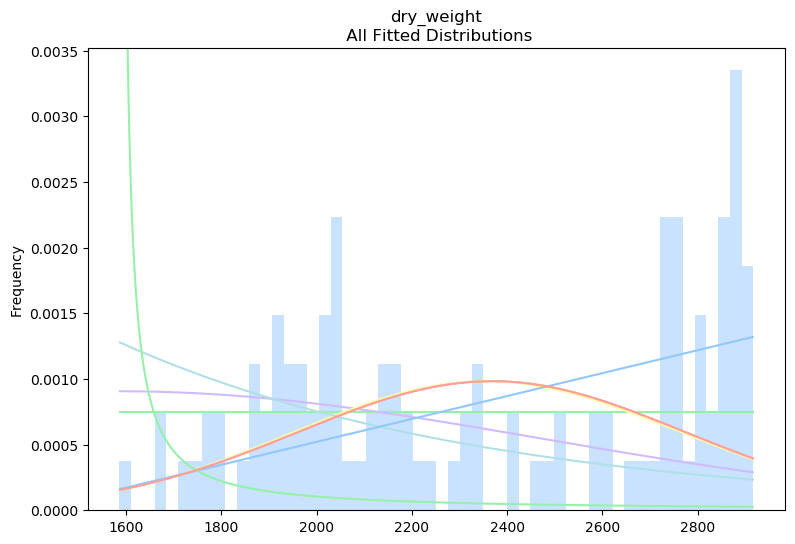

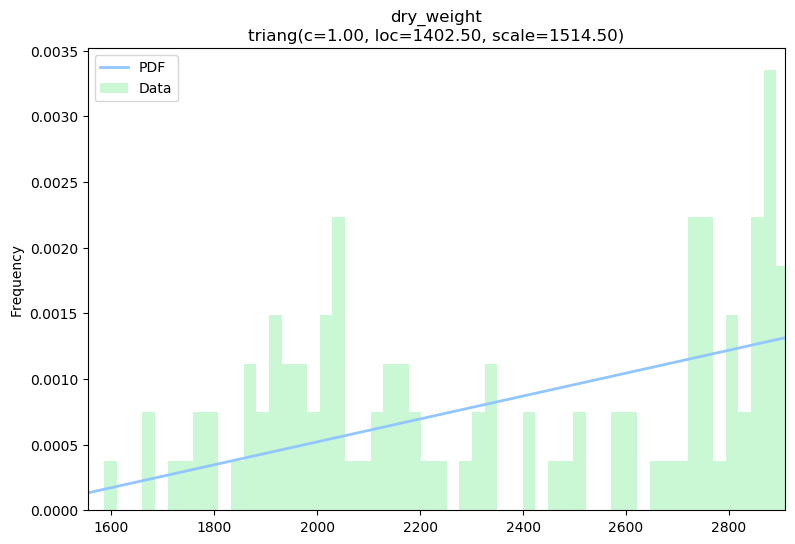

start water_cont
Distribution found: halfnorm


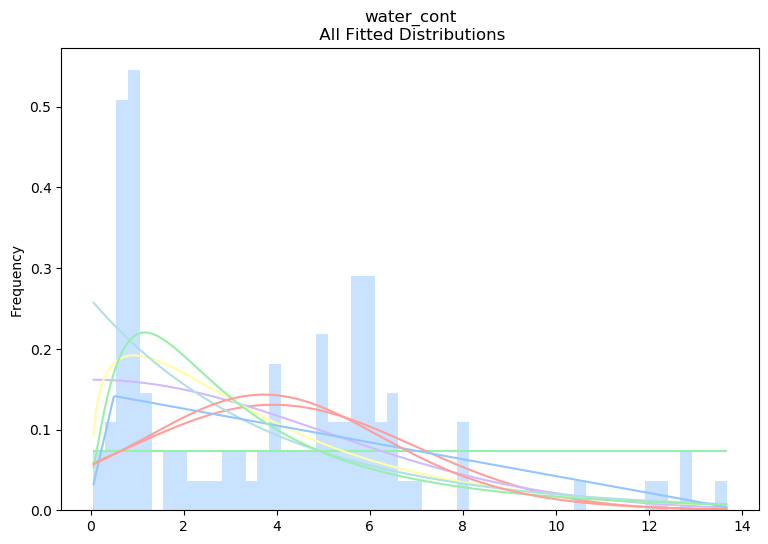

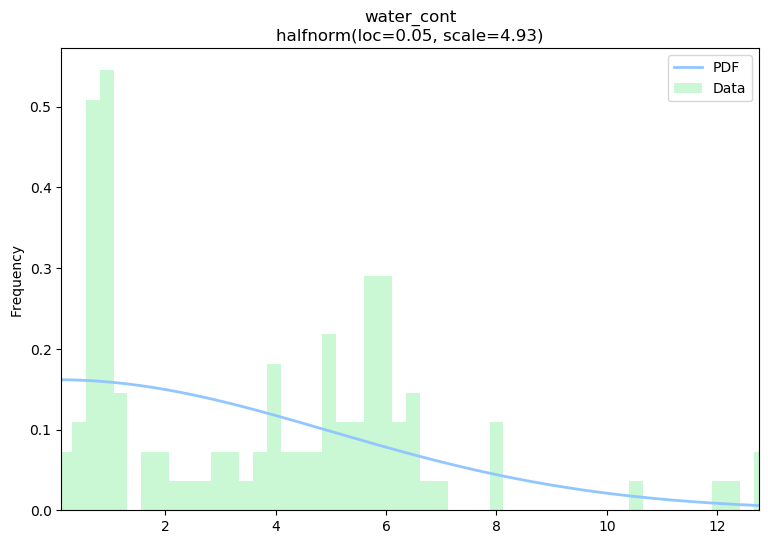

start UCS
Distribution found: lognorm


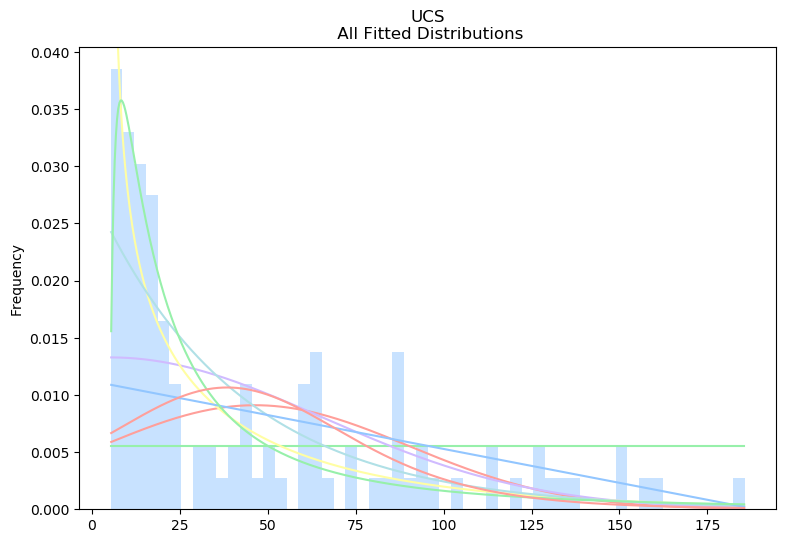

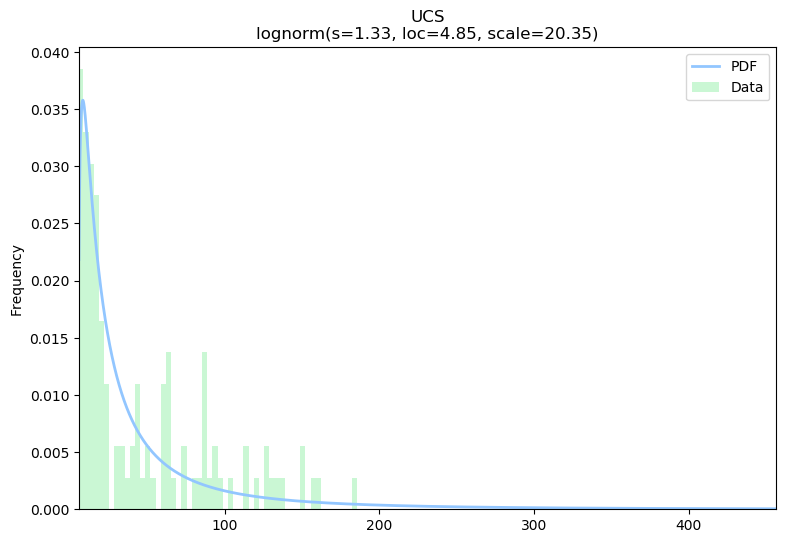

start elastic_mod
Distribution found: gamma


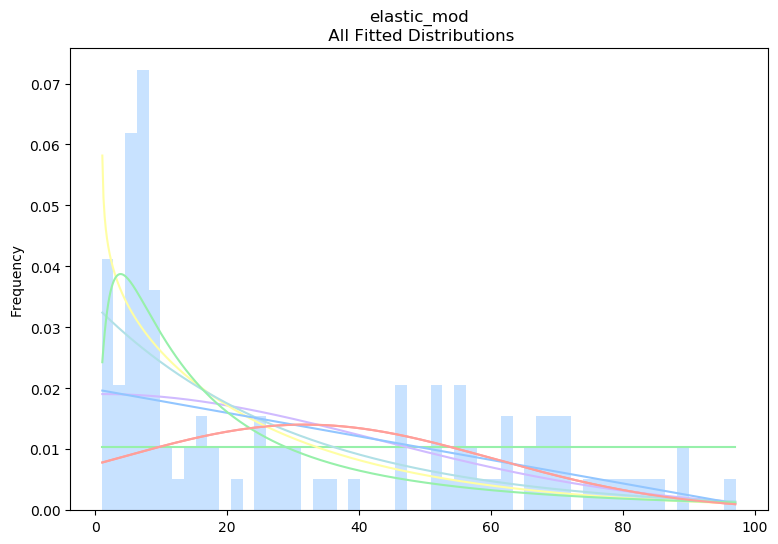

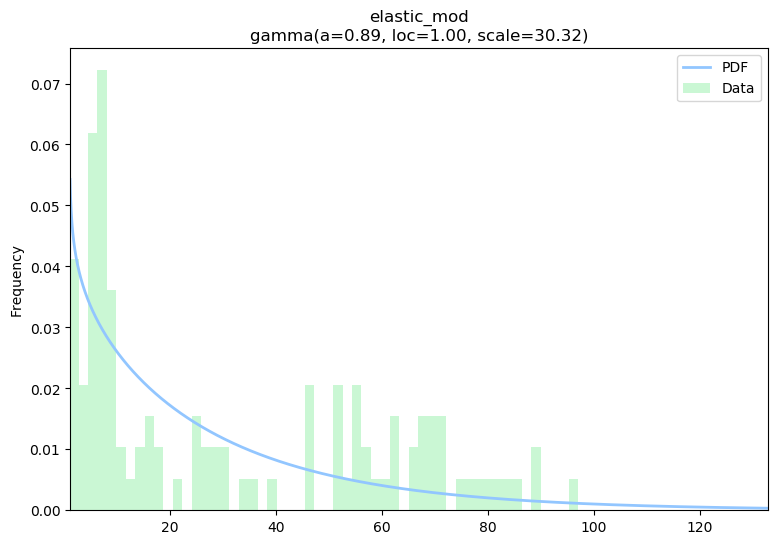

In [16]:
# MUST define dfg remove int or str columns
# Create statistics: all data togheter

dfg = df1.copy()
if 'name' in dfg.columns: dfg = dfg.drop(columns='name').copy()
if 'type' in dfg.columns: dfg = dfg.drop(columns='type').copy()
if 'pred_class' in dfg.columns: dfg = dfg.drop(columns='pred_class').copy()

# Load data from statsmodels datasets

matplotlib.rcParams.update(matplotlib.rcParamsDefault)

with plt.style.context(("seaborn-pastel",)):

    n_cols = dfg.shape[1]

    par_dict={}

    for e in np.arange(0,n_cols,1):

        print('start '+str(dfg.iloc[:,e].name))

        data = dfg.iloc[:,e].dropna().reset_index(drop=True).copy()
        data = pd.Series(data.values.ravel())

        bins = int(len(data)/2)

        y, x = np.histogram(data, bins=bins, density=True)
        x = (x + np.roll(x, -1))[:-1] / 2.0


        # Plot for comparison
        plt.figure(figsize=(9,6))
        ax = data.plot(kind='hist', bins=bins, density=True, alpha=0.5)
        # Save plot limits
        dataYLim = ax.get_ylim()
        dataXLim = ax.get_xlim()

        # Find best fit distribution
        best_fit_name, best_fit_params = best_fit_distribution(data, bins*10, ax)
        best_dist = getattr(st, best_fit_name)

        print('Distribution found: '+str(best_fit_name))

        # Update plots
        
        ax.set_ylim(dataYLim)
        ax.set_xlim(dataXLim)
        
        #ax.set_xlim(ax.get_xlim()[0]*1.2,ax.get_xlim()[1]*1.2)
        #ax.set_ylim(ax.get_ylim()[0]*1.2,ax.get_ylim()[1]*1.2)
        
        ax.set_title(dfg.columns[e] + u'\n All Fitted Distributions')
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')
        
        plt.show()

        # Make PDF with best params 
        pdf = make_pdf(best_dist, best_fit_params)

        # Display
        plt.figure(figsize=(9,6))
        ax = pdf.plot(lw=2, label='PDF', legend=True)
        data.plot(kind='hist', bins=bins, density=True, alpha=0.5, label='Data', legend=True, ax=ax)

        param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
        param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
        dist_str = '{}({})'.format(best_fit_name, param_str)

        # export a list  "par_list" with all results

        dict
        par_list = ([(k,v) for k,v in zip(param_names, best_fit_params)])
        par_dict[dfg.columns[e] + '_'+best_fit_name] = par_list

        ax.set_title(dfg.columns[e] + u'\n' + dist_str)
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')
        
        dataYLim = ax.get_ylim()
        dataXLim = ax.get_xlim()
        
        plt.show()

#### GRAFICO UNICO  (NON DIVISI PER TIPO)

start dry_weight
Distribution found: triang


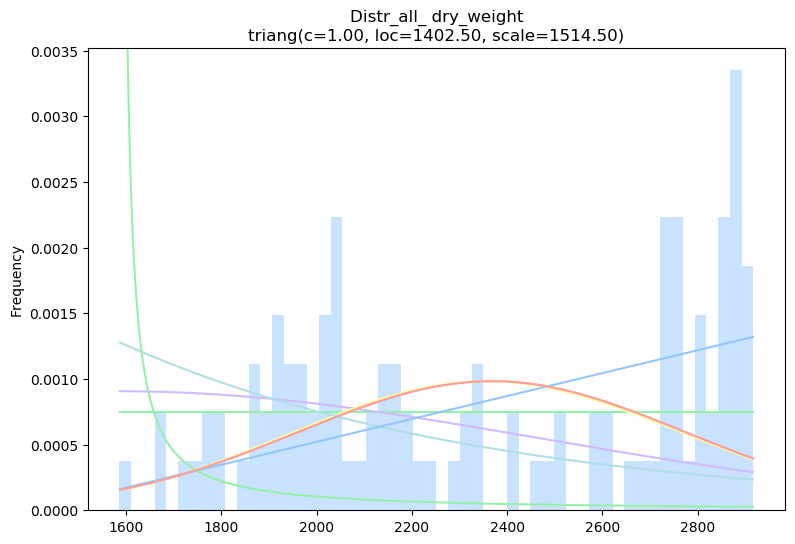

<Figure size 900x600 with 0 Axes>

start water_cont
Distribution found: halfnorm


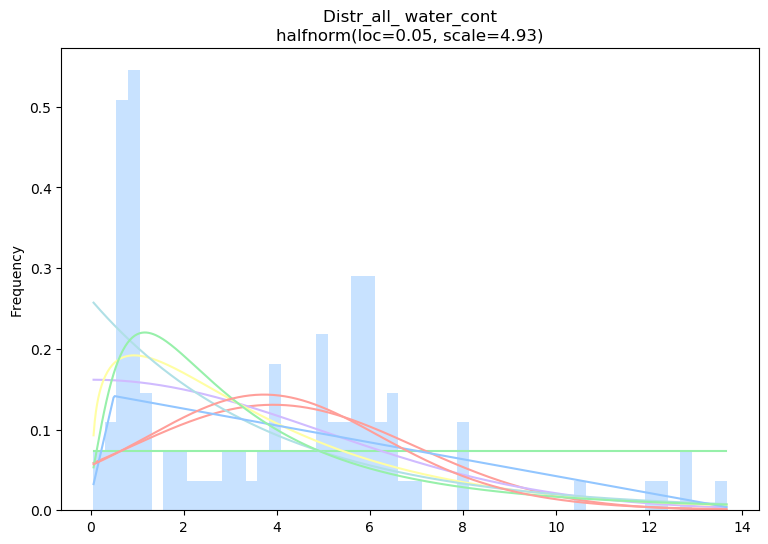

<Figure size 900x600 with 0 Axes>

start UCS
Distribution found: lognorm


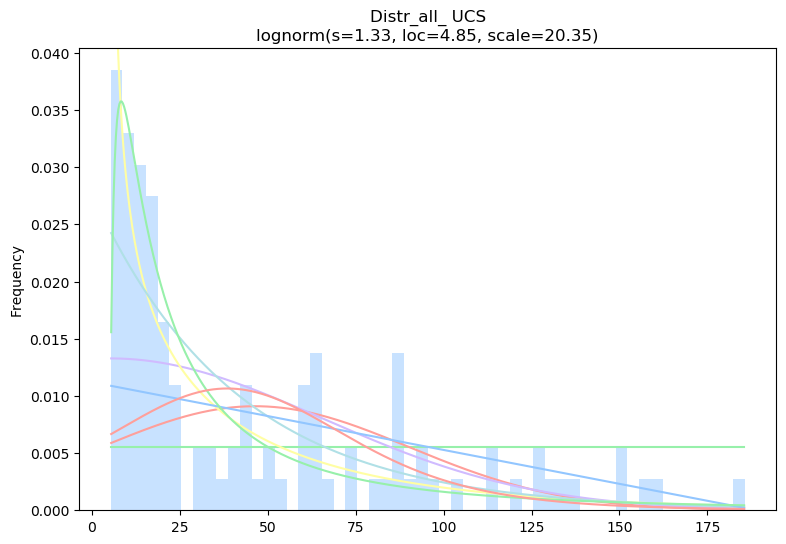

<Figure size 900x600 with 0 Axes>

start elastic_mod
Distribution found: gamma


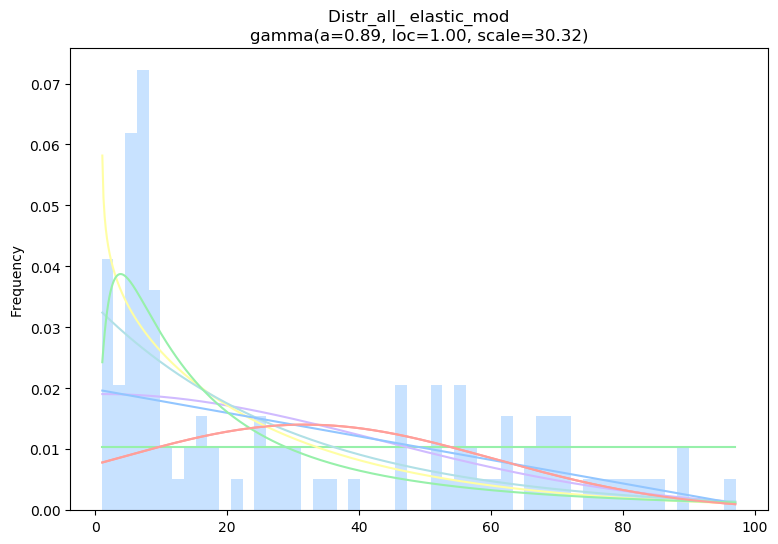

<Figure size 900x600 with 0 Axes>

In [17]:
# MUST define dfg remove int or str columns

dfg = df1[['dry_weight', 'water_cont', 'UCS', 'elastic_mod']].copy()


# Load data from statsmodels datasets    
    
    
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

with plt.style.context(("seaborn-pastel",)):

    n_cols = dfg.shape[1]

    par_dict={}

    for e in np.arange(0,n_cols,1):

        print('start '+str(dfg.iloc[:,e].name))

        data = dfg.iloc[:,e].dropna().reset_index(drop=True).copy()
        data = pd.Series(data.values.ravel())

        bins = int(len(data)/2)
        if bins<10: bins=10

        y, x = np.histogram(data, bins=bins, density=True)
        x = (x + np.roll(x, -1))[:-1] / 2.0  #per ogni bin (x1 + x2)/2 trovo xc centroid


        # Plot for comparison
        plt.figure(figsize=(9,6))
        ax = data.plot(kind='hist', bins=bins, density=True, alpha=0.5)
        # Save plot limits
        dataYLim = ax.get_ylim()
        dataXLim = ax.get_xlim()

        # Find best fit distribution
        best_fit_name, best_fit_params = best_fit_distribution(data, bins*10, ax)
        best_dist = getattr(st, best_fit_name)

        print('Distribution found: '+str(best_fit_name))

        # Update plots
        
        plt.figure(figsize=(9,6))
        ax.set_ylim(dataYLim)
        ax.set_xlim(dataXLim)

#         ax.set_title(dfg.columns[e] + u'\n All Fitted Distributions')
#         ax.set_xlabel('')
#         ax.set_ylabel('Frequency')
#         # Make PDF with best params 
#         pdf = make_pdf(best_dist, best_fit_params)
#         # Display
#         plt.figure(figsize=(12,8))
#         ax = pdf.plot(lw=2, label='PDF', legend=True)
#         data.plot(kind='hist', bins=bins, density=True, alpha=0.5, label='Data', legend=True, ax=ax)

        param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
        param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
        dist_str = '{}({})'.format(best_fit_name, param_str)

        # export a list  "par_list" with all results

        dict
        par_list = ([(k,v) for k,v in zip(param_names, best_fit_params)])
        par_dict[dfg.columns[e] + '_'+best_fit_name] = par_list

        ax.set_title('Distr_all_' +' '+dfg.columns[e] + u'\n' + dist_str)
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')
 
        plt.savefig('PIC//'+ 'Distr_all_' +' '+dfg.columns[e]+'.jpg')
        plt.show()

### PREDICTIVE MODEL FOR MISSING VALUES

In [18]:
# Reinitialize dataframe

df0 = df.loc[:,['name', 'dry_weight', 'water_cont','UCS',
       'elastic_mod', 'poisson','type','rock_type','T']].copy()
df0 = df0.drop(df[(df['type']==4)|(df['type']==5)].index).copy()
df0.columns

Index(['name', 'dry_weight', 'water_cont', 'UCS', 'elastic_mod', 'poisson',
       'type', 'rock_type', 'T'],
      dtype='object')

In [19]:
model1 = LinearRegression()
model2 = ElasticNet(alpha=1.0, l1_ratio=0.5)
model3 = RandomForestRegressor(n_estimators=5000)
model4 = ExtraTreesRegressor(n_estimators=50)
model5 = SVR(kernel='rbf', degree=3, C=1.0, gamma='auto')
model6 = GradientBoostingRegressor(n_estimators=1000)

In [20]:
# must define the varibles to infer values on brackes 
# questa parte è un listato del tipo di variabili di input non serve per il calcolo, ma per definire le variabili della def

X_train   = pd.DataFrame([[1,2,3],[1,2,3],[1,2,3]],index=[1,2,3],columns=[1,2,3])
X_test   = pd.DataFrame([[1,2,3],[1,2,3],[1,2,3]],index=[1,2,3],columns=[1,2,3])
Xcols     = [1,2,3,4]
y_train   = pd.array([1,2,3,4,5])
ycol      = [1,2,3,4]
y_predict = pd.array([1,2,3,4,5])

# start of def
# Inizio a definire i dati di train e di predizione creo una funzione "plt_pred_result"
# Come input di base definisco gli array tipologici sopra 
# Quando lancio la def andro ad inserire ad argomento i dati veri

def plt_pred_result(X_train1= X_train.iloc[:,0], X_test1= X_test.iloc[:,0], Xlabel= Xcols[0], y_train= y_train, ylabel=ycol,  
                    y_predict=y_predict, title = 'Missing data prediction - ',xlog=False,ylog=False):
    
    train_index = X_train1.index
    test_index = X_test1.index
    
    list1 = ['Basalt','Nontronite','Pyroclastics']
    list2 = ['Basalt [Prediction]','Nontronite [Prediction]','Pyroclastics [Prediction]']
    labels = {'dry_weight':'Dry unit weight [kg/m³]', 'water_cont':'Water content [%]', 'UCS':'UCS [MPa]', 'elastic_mod':'Elastic Modulus [GPa]', 'poisson':'Poisson [-]','type':'Type','T':'Splitting Test[MPa]'}
    
    with plt.style.context("seaborn-pastel"):

        df0['colors'] = df0['type'].map(lambda x: dict_col[x])
        df0['colors_pale'] = df0['type'].map(lambda x: dict_col_pale[x])

        fig = plt.figure(figsize=(10,4))
        gs = fig.add_gridspec(12, 12)
        ax1 = fig.add_subplot(gs[:, :9])


        plt.grid(linestyle='--')
        ax1.scatter(X_train1,y_train,c=df0.colors_pale[train_index])
        ax1.scatter(X_test1,y_predict,c=df0.colors[test_index])
        ax1.set_xlabel(labels[Xlabel])
        ax1.set_ylabel(labels[ylabel])
        if xlog: ax1.set_xscale('log')
        if ylog: ax1.set_yscale('log')
        plt.title(title + labels[ylabel], loc="left")


        # Legend creation

        ax2 = fig.add_subplot(gs[:, 9:12])
        ax2.axis('off')

        for gg in np.arange(0,3,1):
            ax2.scatter(2,10-gg,c=dict_col_pale[gg+1])        
            ax2.scatter(2,7-gg,c=dict_col[gg+1])
            ax2.text(3,10-gg,list1[gg])
            ax2.text(3,7-gg,list2[gg])   

        ax2.set_xlim([0,10])
        ax2.set_ylim([0,12])


        plt.show()

        del df0['colors']
        del df0['colors_pale']

### Predict and plot

In [21]:
df0.describe()

,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,205.000000,209.000000,189.000000,106.000000,98.000000,210.000000,78.000000
mean,2367.273171,4.503971,45.630847,32.832264,0.206837,1.523810,7.378462
std,432.505371,3.959788,44.100332,28.384399,0.082981,0.836891,5.747307
min,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,1957.000000,1.000000,11.200000,7.150000,0.142500,1.000000,2.172500
50%,2344.000000,4.000000,25.800000,24.400000,0.210000,1.000000,5.585000
75%,2803.000000,6.220000,65.200000,57.825000,0.250000,2.000000,11.722500
max,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


In [22]:
df0.shape

(210, 9)

In [23]:
df00 = df0.dropna(subset=['UCS','elastic_mod','dry_weight','poisson','T','water_cont'],how='all').copy()
df00.describe()

,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,205.000000,209.000000,189.000000,106.000000,98.000000,210.000000,78.000000
mean,2367.273171,4.503971,45.630847,32.832264,0.206837,1.523810,7.378462
std,432.505371,3.959788,44.100332,28.384399,0.082981,0.836891,5.747307
min,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,1957.000000,1.000000,11.200000,7.150000,0.142500,1.000000,2.172500
50%,2344.000000,4.000000,25.800000,24.400000,0.210000,1.000000,5.585000
75%,2803.000000,6.220000,65.200000,57.825000,0.250000,2.000000,11.722500
max,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


In [24]:
df00 = df0.dropna(subset=['water_cont','type'],how='any').copy()
df00.describe()

,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,204.000000,209.000000,189.000000,105.000000,97.000000,209.000000,78.000000
mean,2365.122549,4.503971,45.630847,32.824000,0.206186,1.526316,7.378462
std,432.469128,3.959788,44.100332,28.520408,0.083160,0.838110,5.747307
min,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,1957.000000,1.000000,11.200000,7.100000,0.140000,1.000000,2.172500
50%,2344.000000,4.000000,25.800000,24.200000,0.210000,1.000000,5.585000
75%,2800.000000,6.220000,65.200000,57.900000,0.250000,2.000000,11.722500
max,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


####  PREDICTION OF MISSIN DRY_WEIGHT WITH WATER CONTENT

[1977.33333333 1987.         2820.69230769 2578.66666667 2406.375     ]


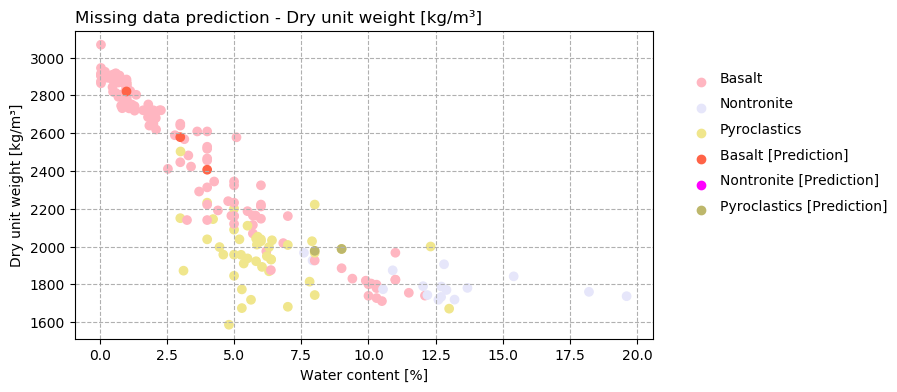

In [25]:
# Xcols sono le colonne di cui ho tutti i dati (in questo caso dry_weight è completo 96su96)
# ycols sono le colonne dove mancano dei dati (in questo caso UCS dove manca un dato 95su96)

Xcols=['water_cont','type']
ycol='dry_weight'
# allcols sono le colonne x(train) + colonna y (predict)
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df00[allcols].dropna().copy()[Xcols]
y_train = df00[allcols].dropna().copy()[ycol]

# n°index righe nelle quali i dati sono completi (95 su 96)
train_index = X_train.index

# riga sulla quale manca il dato
X_test = df00.drop(index=train_index).copy()[Xcols]

# n°index riga sulla quale manca il dato 
test_index = X_test.index

# Fit the model
# Uso model 4 ExtraTreesRegressor

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)

plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)

In [26]:
df0.loc[154:155,:]

,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T
154,BHA-60,NaN,8.00,NaN,NaN,NaN,3,PYR,NaN
155,BHA-61,2721.0,2.28,92.9,NaN,NaN,1,BS,10.51


In [27]:
# Check the graph above if correct validate this cell
# Inserisco nel main DataFrame il dato predetto
df0.loc[test_index, ycol] = y_predict

In [28]:
df0 = df0.dropna(subset=['UCS','elastic_mod','dry_weight','poisson','T','water_cont'],how='all').copy()
df0.describe()

,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,210.000000,209.000000,189.000000,106.000000,98.000000,210.000000,78.000000
mean,2366.957463,4.503971,45.630847,32.832264,0.206837,1.523810,7.378462
std,430.360190,3.959788,44.100332,28.384399,0.082981,0.836891,5.747307
min,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,1967.000000,1.000000,11.200000,7.150000,0.142500,1.000000,2.172500
50%,2375.187500,4.000000,25.800000,24.400000,0.210000,1.000000,5.585000
75%,2802.000000,6.220000,65.200000,57.825000,0.250000,2.000000,11.722500
max,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


### CON I DATI COMPLETI DI DRY_WEIGHT E TYPE AVVIO LE PREDIZIONI

[140.672    9.202    3.8    119.822    7.4     12.068   12.502   35.6984
  11.4     41.1     96.0355  48.31    22.3     19.95    12.7992  11.6064
 113.37    26.76   108.375   40.8     15.025 ]


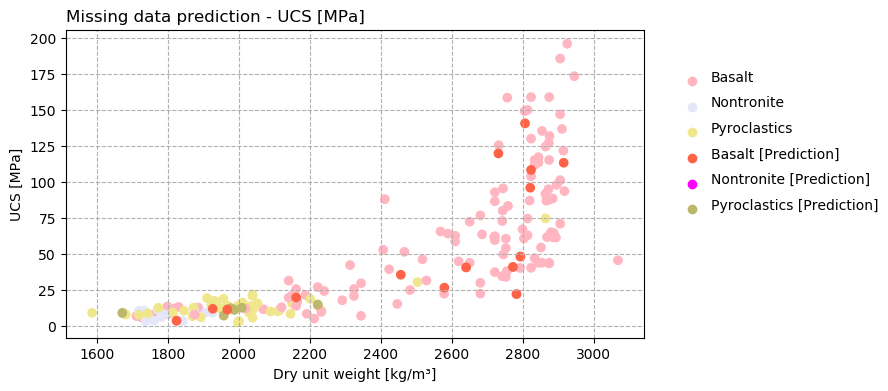

In [29]:
# Xcols sono le colonne di cui ho tutti i dati (in questo caso dry_weight è completo 96su96)
# ycols sono le colonne dove mancano dei dati (in questo caso UCS dove manca un dato 95su96)

Xcols=['dry_weight','type']
ycol='UCS'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df0[allcols].dropna().copy()[Xcols]
y_train = df0[allcols].dropna().copy()[ycol]

# n°index righe nelle quali i dati sono completi (95 su 96)
train_index = X_train.index

# riga sulla quale manca il dato
X_test = df0.drop(index=train_index).copy()[Xcols]

# n°index riga sulla quale manca il dato 
test_index = X_test.index

# Fit the model
# Uso model 4 ExtraTreesRegressor

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)

plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)

In [30]:
# Check the graph above if correct validate this cell
# Inserisco nel main DataFrame il dato predetto
df0.loc[test_index, ycol] = y_predict

In [31]:
df0.describe()

,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,210.000000,209.000000,210.000000,106.000000,98.000000,210.000000,78.000000
mean,2366.957463,4.503971,45.396312,32.832264,0.206837,1.523810,7.378462
std,430.360190,3.959788,43.968104,28.384399,0.082981,0.836891,5.747307
min,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,1967.000000,1.000000,11.400000,7.150000,0.142500,1.000000,2.172500
50%,2375.187500,4.000000,25.450000,24.400000,0.210000,1.000000,5.585000
75%,2802.000000,6.220000,65.050000,57.825000,0.250000,2.000000,11.722500
max,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


#### Predict Water content

[0.846]


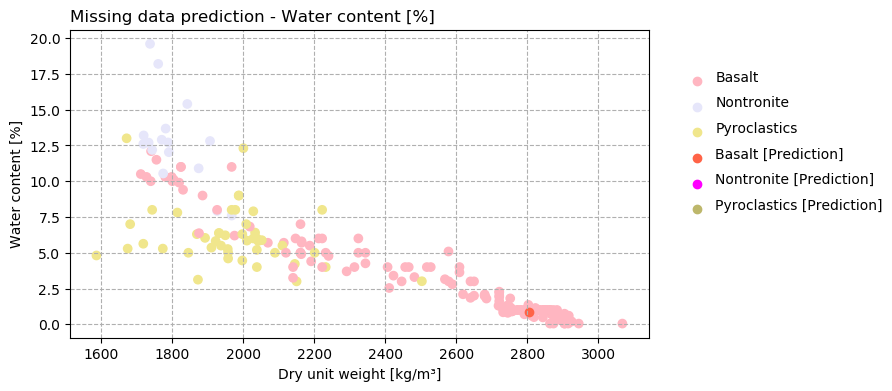

In [32]:
Xcols=['dry_weight','UCS','type']
ycol='water_cont'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df0[allcols].dropna().copy()[Xcols]
y_train = df0[allcols].dropna().copy()[ycol]

train_index = X_train.index

X_test = df0.drop(index=train_index).copy()[Xcols]

test_index = X_test.index

# Fit the model

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)

plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)

In [33]:
# Check the graph above if correct validate this cell
df0.loc[test_index, ycol] = y_predict

#### Elastic modulus prediction

[2.42848924 2.27313258 2.07424342 2.51183429 2.17789196 2.49177739
 1.81547982 2.10239631 1.96966191 2.463613   2.04826464 2.0472082
 0.97545868 0.86851702 0.92938788 1.79798562 1.84371435 1.79405744
 1.82496911 1.89751231 1.81197352 0.61696288 3.5481733  4.23715119
 1.55194354 3.07484321 1.40162301 2.6123065  1.22261061 3.12285144
 3.92947208 1.49421154 1.66819435 3.34011951 4.69807811 4.15660605
 1.42433544 2.81262834 3.64160534 4.12915959 4.27667689 1.45969999
 3.73840062 0.36347225 4.29428982 1.22261061 1.486198   2.92417971
 3.74912026 2.40885156 1.65334972 4.08526186 1.03654517 3.50255359
 1.37421389 3.41541316 3.29967878 3.75838654 3.7220542  4.5261391
 3.80071529 1.99713889 3.4093957  4.46220079 3.47141614 4.04633516
 1.57755659 3.41541316 1.45969999 4.11252699 3.70957729 3.88161113
 3.52908056 4.2626914  4.36188622 3.5481733  4.07726566 2.91320341
 3.0329507  2.82173648 3.0329507  2.25445481 2.55964993 3.15956709
 3.47141614 1.67264727 3.19951243 2.37681718 4.24882598 4.597866

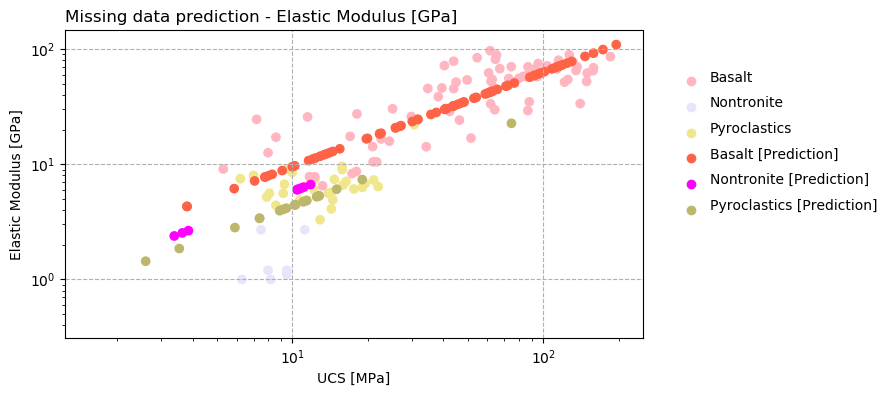

In [34]:
Xcols=['UCS','type']
# Xcols=['UCS']
ycol='elastic_mod'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = np.log(df0[allcols].dropna().copy()[Xcols])
y_train = np.log(df0[allcols].dropna().copy()[ycol])

train_index = X_train.index

X_test = np.log(df0.drop(index=train_index).copy()[Xcols])

test_index = X_test.index

# Fit the model

model1.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model1.predict(X=X_test)
print(y_predict)


plt_pred_result(np.exp(X_train.iloc[:,0]), np.exp(X_test.iloc[:,0]), Xcols[0], np.exp(y_train), ycol, 
                np.exp(y_predict),ylog=True,xlog=True)

#### Elastic modulus with Random Forest

[1.94672709 1.86926737 1.84109978 1.94281743 1.72178589 2.0298222
 1.80414653 1.68582593 1.82227218 2.15092471 1.68418296 1.74905281
 0.25824546 0.41716574 0.03281788 0.6042885  0.68479171 0.8436379
 0.81120069 0.71130448 0.74795916 1.42884336 4.18301279 4.22796823
 1.91458594 2.88885935 1.31251144 2.99543904 1.83696907 3.66010809
 3.9010077  1.92563175 1.65315356 3.18656193 4.40605429 4.33355273
 1.65146258 2.58429404 3.93903914 4.37079162 4.18730603 1.50652984
 4.02476013 1.98645308 4.05723429 1.80466583 1.89844515 3.06992852
 4.37058081 2.24421148 1.5274268  3.99137877 2.03982638 4.41099579
 1.595542   4.02301829 3.143534   3.91107581 3.85163749 4.14459895
 3.47911159 2.07870992 3.5638801  4.20989488 4.36446333 4.14367087
 1.60598756 4.02301829 1.50652984 4.23293542 3.57623287 3.73038771
 4.32268886 4.21181025 4.21863179 4.18301279 4.34152493 3.4854064
 2.91774727 2.78027055 2.62158525 2.54641937 2.30699962 3.06365148
 4.22597088 1.79734274 2.90957063 1.98659677 4.38411904 4.4005898

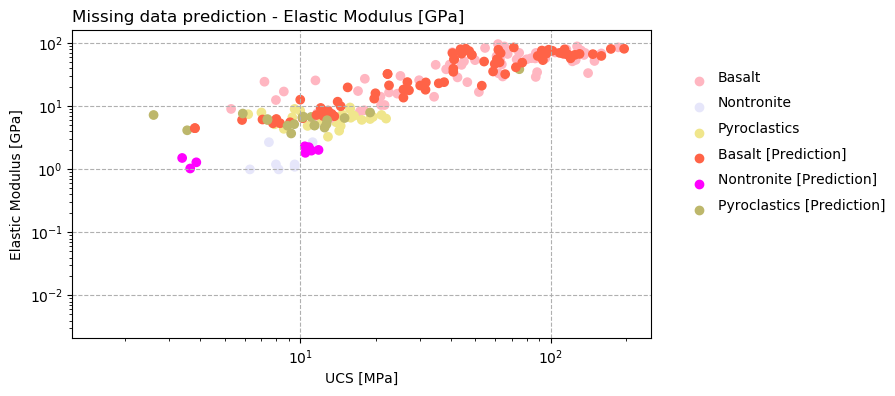

In [35]:
# Model with 4 regressor

Xcols=['UCS','water_cont','dry_weight','type']
# Xcols=['UCS']
ycol='elastic_mod'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = np.log(df0[allcols].dropna().copy()[Xcols])
y_train = np.log(df0[allcols].dropna().copy()[ycol])

train_index = X_train.index

X_test = np.log(df0.drop(index=train_index).copy()[Xcols])

test_index = X_test.index

# Fit the model

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)


plt_pred_result(np.exp(X_train.iloc[:,0]), np.exp(X_test.iloc[:,0]), Xcols[0], np.exp(y_train), ycol, 
                np.exp(y_predict),ylog=True,xlog=True)

[2.0147968  1.93607385 1.92438681 2.06500826 1.93192092 2.06203314
 2.04350964 1.93592102 1.95238394 2.06287194 1.93517575 1.93153171
 2.09385825 2.22008363 2.16063886 1.53980307 1.5809764  1.49175246
 1.50037301 1.53217039 1.4941838  2.32996531 3.87633656 4.1852089
 1.76861426 2.98242644 1.6220955  2.42680339 1.76197614 3.62609921
 4.11452583 1.72478161 1.65717515 3.59401579 4.04318144 4.20770138
 1.64865743 2.54931872 3.95472679 4.20600928 4.1813001  2.36458963
 4.04877139 2.59487021 4.1539767  1.76197614 1.7183641  2.94530334
 4.08003815 2.04315546 1.71350943 4.16187958 1.91340816 3.91204018
 1.64513284 3.71296817 3.43141163 4.03731928 4.01122157 4.10322397
 4.01483953 2.05063583 3.65693151 4.14101841 3.81011033 4.19796804
 1.69569851 3.71296817 2.36458963 4.18857928 3.9641683  4.0855615
 3.86893054 4.18142417 4.15790835 3.87633656 4.19661783 2.96820861
 2.96362772 2.57160084 2.88819473 2.08705043 2.27999712 3.31199842
 3.81668752 1.73082612 3.13724925 2.04071773 4.20044674 4.092073

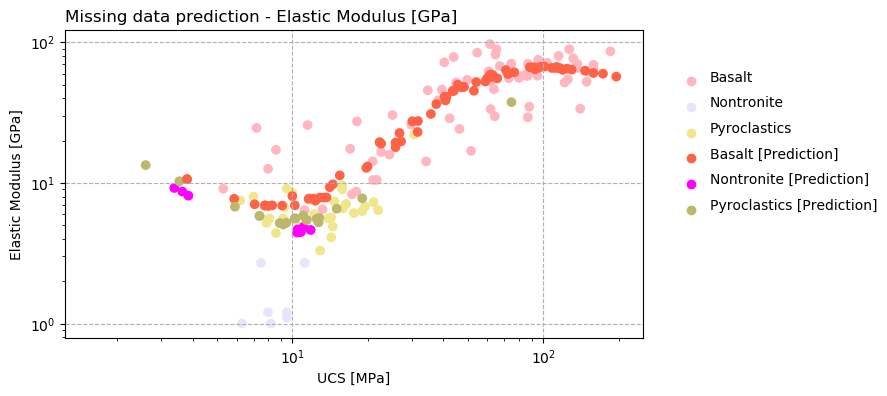

In [36]:
# Model with 3 regressor SVR

Xcols=['UCS','dry_weight','type']
# Xcols=['UCS']
ycol='elastic_mod'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = np.log(df0[allcols].dropna().copy()[Xcols])
y_train = np.log(df0[allcols].dropna().copy()[ycol])

train_index = X_train.index

X_test = np.log(df0.drop(index=train_index).copy()[Xcols])

test_index = X_test.index

# Fit the model

model5.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model5.predict(X=X_test)
print(y_predict)


plt_pred_result(np.exp(X_train.iloc[:,0]), np.exp(X_test.iloc[:,0]), Xcols[0], np.exp(y_train), ycol, 
                np.exp(y_predict),ylog=True,xlog=True)

[2.07539217 2.23244552 2.61261055 1.97257807 2.68216025 1.97258138
 2.44323236 2.73419221 2.94843023 1.9718571  2.66296417 2.66296417
 0.26068031 0.26068031 0.26068031 0.71535469 0.71651508 0.71473064
 0.71457523 0.73133233 0.71476955 1.97197474 3.70779114 4.24368706
 1.70216796 3.29889937 1.80335747 2.61948765 1.92473323 4.1574393
 4.17061209 2.00707335 1.45398909 3.74708365 4.36443819 4.26228219
 2.08140865 2.62138668 4.01312443 4.24310865 4.29697151 2.45145287
 4.17356338 1.97197474 4.07413938 1.92473323 2.00578902 2.66154838
 3.82614925 2.14713772 1.86891313 4.17713999 1.97024137 3.47525448
 1.69734784 4.01603651 3.53891269 3.9665054  4.17356338 4.1973025
 4.40016933 1.86721401 4.07302038 3.97468081 4.04632986 3.74190652
 1.6729032  4.01603651 2.45145287 4.24055129 4.17625062 4.09713737
 3.47290067 4.29672429 4.33434402 3.70779114 4.13815137 2.6591161
 3.18755487 2.57375428 3.18755487 2.27318583 2.11905027 3.20337791
 4.04632986 1.45378261 3.17836    2.31386599 4.22752634 4.3644381

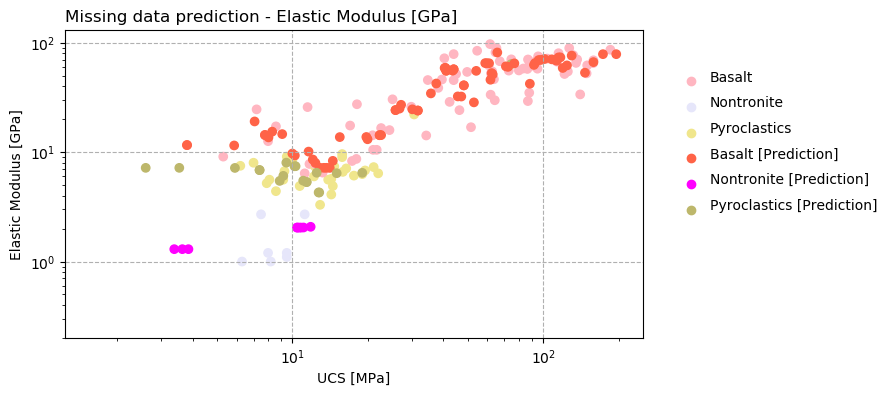

In [37]:
# Model with 2 regressor RandomForestRegressor

Xcols=['UCS','type']
# Xcols=['UCS']
ycol='elastic_mod'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = np.log(df0[allcols].dropna().copy()[Xcols])
y_train = np.log(df0[allcols].dropna().copy()[ycol])

train_index = X_train.index

X_test = np.log(df0.drop(index=train_index).copy()[Xcols])

test_index = X_test.index

# Fit the model

model3.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model3.predict(X=X_test)
print(y_predict)


plt_pred_result(np.exp(X_train.iloc[:,0]), np.exp(X_test.iloc[:,0]), Xcols[0], np.exp(y_train), ycol, 
                np.exp(y_predict),ylog=True,xlog=True)

[2.57589091 2.68384105 2.44127011 2.47992652 2.60611296 2.52908239
 2.40945606 2.50213166 2.46188775 2.63985684 2.43194846 2.4680321
 0.39730071 0.69527624 0.09993173 0.41072938 0.50637463 0.85256365
 0.90121946 0.99325177 0.88500085 1.9887039  4.233473   4.21732412
 1.95790703 2.77483782 1.73352705 2.99415529 1.91899637 3.57727007
 3.87431427 1.82764956 1.40522902 3.77869147 4.26910965 4.26234738
 1.74688069 2.70678406 4.05182281 4.31575154 4.20220345 2.39555104
 4.17479605 1.97548031 4.04367487 1.91899637 1.92745998 3.11766827
 4.32252876 2.82942296 1.70727989 4.08357274 2.01238006 4.37161854
 1.68296709 4.02913201 3.39378853 3.98231713 3.99261566 4.19168791
 3.32437516 2.21072518 3.84112482 4.31090717 4.3792532  4.26035763
 1.80937222 4.02913201 2.39555104 4.24539128 3.99997824 3.83056189
 4.32668893 4.19376804 4.06144269 4.233473   4.118851   3.22789538
 2.86231026 2.96793777 2.74302801 2.52903444 2.28606033 3.360828
 4.29139059 1.83351126 2.73457206 3.12600732 4.03316025 4.2243638

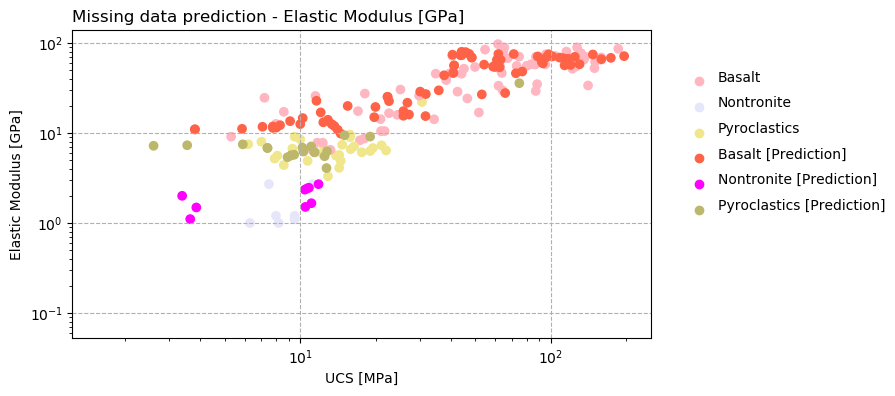

In [38]:
# Model with 3 regressor ExtraTreesRegressor

Xcols=['UCS','dry_weight','type']
# Xcols=['UCS']
ycol='elastic_mod'
allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = np.log(df0[allcols].dropna().copy()[Xcols])
y_train = np.log(df0[allcols].dropna().copy()[ycol])

train_index = X_train.index

X_test = np.log(df0.drop(index=train_index).copy()[Xcols])

test_index = X_test.index

# Fit the model

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)


plt_pred_result(np.exp(X_train.iloc[:,0]), np.exp(X_test.iloc[:,0]), Xcols[0], np.exp(y_train), ycol, 
                np.exp(y_predict),ylog=True,xlog=True)

In [39]:
# Check the graph above if correct validate this cell  # ricordati di esprimere i risultati in np.exp or np.log10 in case
# il caso ritenuto è 3 regressor con extratrees perché i basalti non sconfinano nelle piroclastiti
df0.loc[test_index, ycol] = np.exp(y_predict)

In [40]:
df0.drop(index=train_index).to_excel('TABOUT/data_complete_ML.xls')

#### Elastic modulus prediction with Keras

In [41]:
# Export data to csv for analysis in separate notebook

X_train.to_csv('X_keras.csv')
y_train.to_csv('y_keras.csv')
X_test.to_csv('Xt_keras.csv')

C:\ProgramData\Anaconda3_1\envs\newenv1\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.



Import data from Keras analysis

In [42]:
df_keras = pd.read_csv('Xtest_y.csv', index_col=0)

In [43]:
df_keras.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22 entries, 6 to 94
Data columns (total 5 columns):
dry_weight     22 non-null int64
water_cont     22 non-null float64
UCS            22 non-null float64
type           22 non-null int64
elastic_mod    22 non-null float64
dtypes: float64(3), int64(2)
memory usage: 1.0 KB


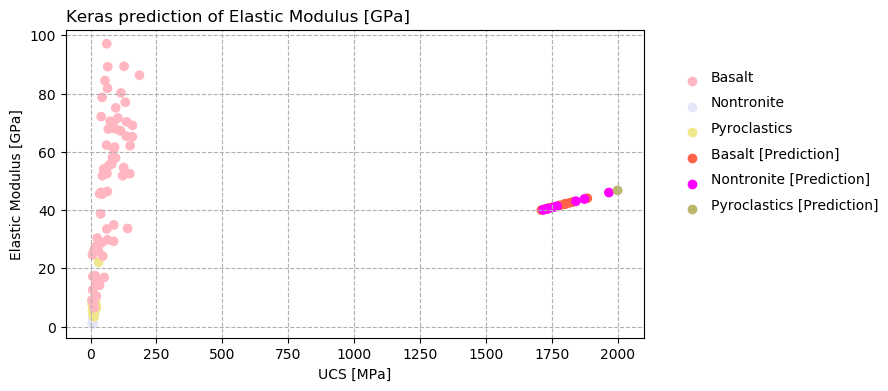

In [44]:
plt_pred_result(np.exp(X_train.iloc[:,0]), df_keras.iloc[:,0], Xcols[0], np.exp(y_train), ycol, df_keras.iloc[:,4],title='Keras prediction of ')

#### Poisson ration prediction

[0.2272554  0.33232998 0.34177843 0.22301567 0.29764206 0.22612967
 0.12468684 0.33034263 0.21821706 0.19732119 0.33550202 0.33550202
 0.07260866 0.37963192 0.12465841 0.21555721 0.14331774 0.19159181
 0.23918961 0.20157943 0.28236886 0.28236886 0.27136482 0.29664219
 0.08500289 0.22362587 0.25656494 0.19353527 0.17240551 0.23017035
 0.1614624  0.23314192 0.24238371 0.21280991 0.23991078 0.18348862
 0.20403069 0.21354811 0.23786105 0.25068204 0.05956303 0.2303695
 0.23737114 0.26818546 0.127595   0.32328778 0.23910725 0.08930299
 0.25119653 0.24868226 0.27579237 0.17874047 0.23790048 0.21717898
 0.20049292 0.17469345 0.06451539 0.24565199 0.29875983 0.21769744
 0.16891043 0.20419389 0.22279364 0.22813816 0.25662737 0.13743956
 0.20974709 0.24210276 0.22522531 0.22436807 0.21743659 0.21769744
 0.127595   0.22094026 0.21539463 0.23540476 0.25656493 0.24494523
 0.22255199 0.26036207 0.21022218 0.22362587 0.22820374 0.12103882
 0.2157876  0.10157344 0.21983421 0.3085942  0.14763482 0.14496

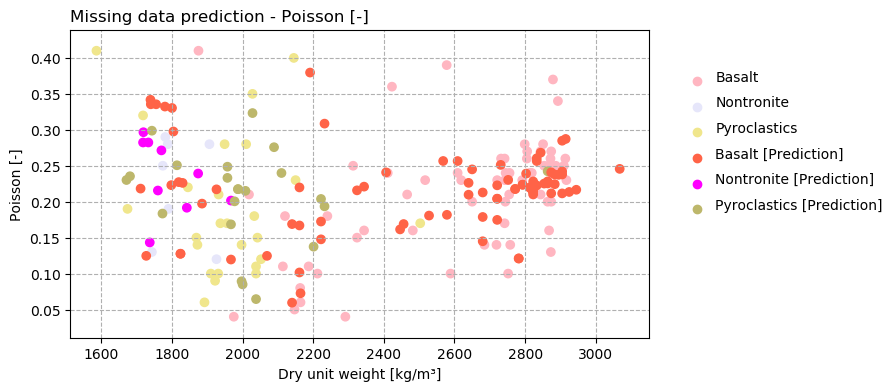

In [45]:
Xcols=['dry_weight','water_cont','UCS','type','elastic_mod']
ycol='poisson'

allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df0[allcols].dropna().copy()[Xcols]
y_train = df0[allcols].dropna().copy()[ycol]

train_index = X_train.index

X_test = df0.drop(index=train_index).copy()[Xcols]

test_index = X_test.index

# Fit the model

model6.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model6.predict(X=X_test)
print(y_predict)


plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)
        

[0.2848 0.29   0.3292 0.2534 0.3284 0.2672 0.2524 0.3516 0.309  0.2596
 0.3326 0.3362 0.0974 0.2244 0.1856 0.2328 0.1848 0.2138 0.2498 0.197
 0.1968 0.1968 0.245  0.2016 0.1586 0.2454 0.2594 0.2294 0.1604 0.1918
 0.1706 0.227  0.196  0.1868 0.2856 0.2056 0.1896 0.2132 0.231  0.2278
 0.0576 0.2214 0.2334 0.2678 0.2524 0.334  0.2556 0.157  0.2502 0.227
 0.2736 0.2936 0.245  0.2146 0.205  0.2196 0.166  0.2428 0.2656 0.2226
 0.1894 0.1758 0.1968 0.2304 0.1494 0.1576 0.2074 0.2348 0.2294 0.234
 0.239  0.2226 0.2524 0.1398 0.2332 0.2568 0.239  0.1734 0.2194 0.266
 0.2442 0.2454 0.2008 0.2358 0.1716 0.0686 0.1302 0.21   0.1436 0.1958
 0.2242 0.1854 0.1232 0.083  0.2602 0.21   0.243  0.1316 0.239  0.2366
 0.28   0.1822 0.2216 0.2242 0.191  0.2358 0.2376 0.2074 0.249  0.2078
 0.1914 0.2152]


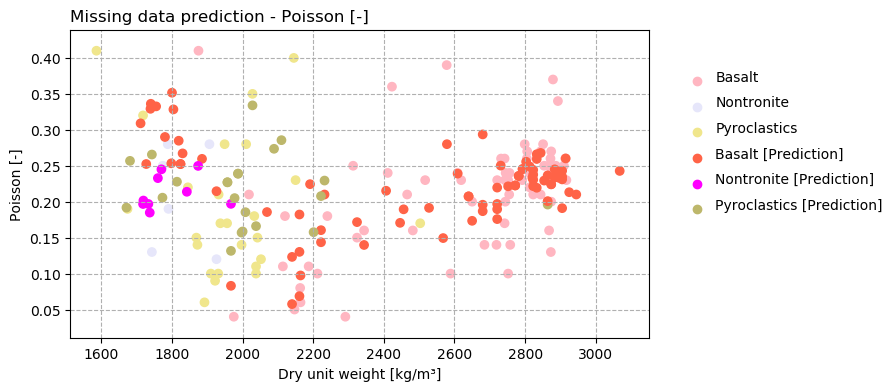

In [46]:
Xcols=['dry_weight','UCS','type','elastic_mod']
ycol='poisson'

allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df0[allcols].dropna().copy()[Xcols]
y_train = df0[allcols].dropna().copy()[ycol]

train_index = X_train.index

X_test = df0.drop(index=train_index).copy()[Xcols]

test_index = X_test.index

# Fit the model

model4.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model4.predict(X=X_test)
print(y_predict)


plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)
        

In [47]:
# Check the graph above if correct validate this cell
df0.loc[test_index, ycol] = y_predict

### BRAZILIAN TEST  T PREDICTION

[13.76975739 13.27543852 11.57599371  5.14608643  6.62964417  8.41249
  1.4592005   1.47075463  1.43892485  1.66525605  1.38031041  1.58734223
  1.83141129  1.3544451   1.78818834  1.4518734   1.49333815  1.327902
 10.59204784 12.47510922  8.96929567 12.6912596  16.3734155  10.55749042
  9.44372689 11.02299237  9.16543567 15.66105827  8.5860445  10.83429835
 14.10668283 13.61101     9.34042196 13.42829    10.71441731 13.67457635
 13.43792013 13.74775669 13.285744    8.59449913 10.05441413 12.46134727
  3.07672327  2.5512812   2.5788875   3.78489097  2.34909969  3.066595
  2.20339018  2.41428683  2.2195661   2.882565   10.33801044 10.73469998
  4.5865      5.44493383  5.6219985   9.26566352  1.82972819  1.43443361
  1.77880916  1.85223442  1.42685921  1.69718492  1.56502577  2.19462801
  2.13429301  2.2709119   1.62450376  2.05990127  1.40520773  1.50993693
  1.54904977  1.40896573  2.07314542  2.6284813   1.89577354  2.156073
  2.10003114  2.18928437  1.87463675  2.29324161  2.08470244

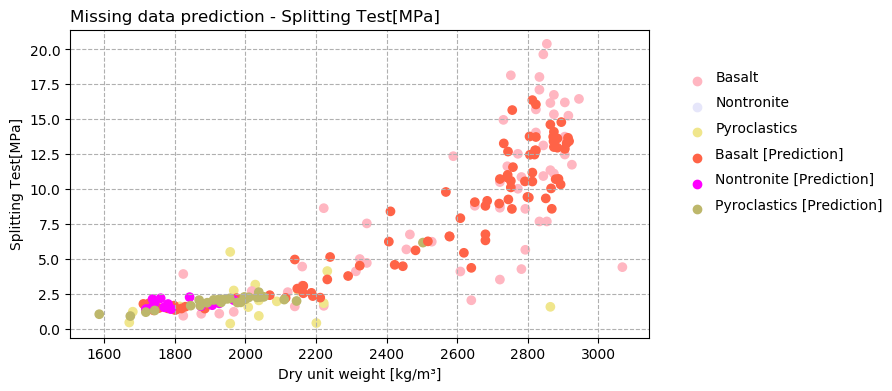

In [48]:
Xcols=['dry_weight','UCS','type','elastic_mod']
ycol='T'

allcols = Xcols.copy() # attenzione se non metto copy quindo faccio append lo fa anche in Xcols
allcols.append(ycol)

X_train = df0[allcols].dropna().copy()[Xcols]
y_train = df0[allcols].dropna().copy()[ycol]

train_index = X_train.index

X_test = df0.drop(index=train_index).copy()[Xcols]

test_index = X_test.index

# Fit the model

model3.fit(X=np.array(X_train).reshape(-1,len(Xcols)), y=np.array(y_train))

# Model predict and assign

y_predict = model3.predict(X=X_test)
print(y_predict)


plt_pred_result(X_train.iloc[:,0], X_test.iloc[:,0], Xcols[0], y_train, ycol, y_predict)
        

In [49]:
# Check the graph above if correct validate this cell
df0.loc[test_index, ycol] = y_predict

### PREDITION PHASE TERMINATED

In [50]:
df0.reset_index(inplace=True)  # creo una colonna index che mi serve in futuro per avere la posizione univoca degli elementi

In [51]:
df0.head(3)

,index,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T
0,0,BS-1,2805.0,0.83,149.2,52.5,0.26,1,BS-S,13.769757
1,1,BS-2,2732.0,0.84,125.6,54.6,0.26,1,BS-S,13.275439
2,2,BS-3,2758.0,0.91,83.4,58.1,0.14,1,BS-S,11.575994


In [52]:
df0.describe()

,index,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,114.342857,2366.957463,4.486552,45.396312,32.797776,0.214025,1.523810,6.553216
std,69.475868,430.360190,3.958360,43.968104,27.674995,0.068824,0.836891,5.184098
min,0.000000,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,52.250000,1967.000000,1.000000,11.400000,7.400000,0.174000,1.000000,2.008370
50%,120.500000,2375.187500,4.000000,25.450000,22.346818,0.222600,1.000000,4.505619
75%,175.750000,2802.000000,6.215000,65.050000,58.089503,0.250000,2.000000,10.809399
max,233.000000,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


##  KMEANS CLASSIFIER

In [53]:
df2 = df0.copy()
try:
    df2=df2[['dry_weight', 'water_cont', 'UCS', 'elastic_mod', 'type']].copy()
except:
    print('error occurred')

In [54]:
df2_col = df2.columns
df2_index = df2.index
df2_col

Index(['dry_weight', 'water_cont', 'UCS', 'elastic_mod', 'type'], dtype='object')

In [55]:
# normalize columns

x = df2.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df2 = pd.DataFrame(x_scaled)
df2.columns = df2_col

In [56]:
df2.UCS *= 7
df2.type *=6
df2.elastic_mod *= 5
df2.dry_weight *= 4

In [57]:
df2.describe()

,dry_weight,water_cont,UCS,elastic_mod,type
count,210.000000,210.000000,210.000000,210.000000,210.000000
mean,2.107847,0.226934,1.549789,1.654411,1.571429
std,1.161566,0.202474,1.592223,1.439906,2.510674
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.028340,0.048593,0.318676,0.332986,0.000000
50%,2.130061,0.202046,0.827470,1.110657,0.000000
75%,3.282051,0.315345,2.261511,2.970318,3.000000
max,4.000000,1.000000,7.000000,5.000000,6.000000


In [58]:
# Loading dataset
model = KMeans(n_clusters=5)

model.fit(df2)

all_prediction= model.predict(df2)

# Insert classes into the main df
df1 = df0.loc[df2_index,:].copy()
df1['pred_class']=all_prediction           #insert the class calculated
df1['pred_class'] = df1['pred_class'].astype(str)  # avoid continuous color scale on pred_class

#### RIORDINO IN BASE AL PLOT UCS-ELAST_MOD

In [59]:
clust_cent = model.cluster_centers_     # row for each class
clust_cent

array([[1.58653458e+00, 3.08563365e-01, 5.90007457e-01, 8.07773793e-01,
        1.11022302e-15],
       [3.40609397e+00, 3.46605066e-02, 4.65006450e+00, 3.43718331e+00,
        2.22044605e-16],
       [1.07906701e+00, 3.06154432e-01, 4.02750371e-01, 3.37829138e-01,
        6.00000000e+00],
       [3.18977151e+00, 6.64079725e-02, 2.15037373e+00, 3.06016209e+00,
        1.11022302e-15],
       [5.82321188e-01, 6.52749361e-01, 2.14517589e-01, 4.09585939e-02,
        3.00000000e+00]])

In [60]:
Rdist = []
for ii in np.arange(0,clust_cent.shape[0],1):
    R = 0   
    for ee in np.arange(2,4,1):   # only for position 2,3 UCS-mod-elast
        R += clust_cent[ii][ee]**2
    Rdist.append(np.sqrt(R))

In [61]:
dfgroups = pd.DataFrame({"R":Rdist}).sort_values('R').reset_index().reset_index()
neworder = []
oldorder = []
neworder = ''.join([str(elem) for elem in dfgroups.iloc[:,0].tolist()])
oldorder = ''.join([str(elem) for elem in dfgroups.iloc[:,1].tolist()])
dict_groups = dict(zip(oldorder,neworder))
dict_groups

{'4': '0', '2': '1', '0': '2', '3': '3', '1': '4'}

In [62]:
df1['pred_class'] = df1['pred_class'].apply(lambda x: dict_groups[x])

### PLOT 

In [63]:
df1['type_str'] = df1.type.map(lambda x: dict_type[x])
df1

,index,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T,pred_class,type_str
0,0,BS-1,2805.000,0.83,149.200,52.500000,0.2600,1,BS-S,13.769757,4,Basalt
1,1,BS-2,2732.000,0.84,125.600,54.600000,0.2600,1,BS-S,13.275439,4,Basalt
2,2,BS-3,2758.000,0.91,83.400,58.100000,0.1400,1,BS-S,11.575994,3,Basalt
3,3,BS - 4,2240.000,4.78,24.400,15.900000,0.1800,1,BS-W-Ves,5.146086,2,Basalt
4,4,BS - 5,2578.000,5.09,22.600,16.600000,0.3900,1,BS-W-Ves,6.629644,2,Basalt
...,...,...,...,...,...,...,...,...,...,...,...,...
205,229,BHA-135,2813.000,1.00,63.000,65.066418,0.2490,1,BS,10.549551,3,Basalt
206,230,BHA-136,2222.000,8.00,15.025,9.437054,0.2078,3,PYR,1.840000,1,Pyroclastic
207,231,BHA-137,2528.000,4.00,31.700,27.066851,0.1914,1,BS,6.240000,2,Basalt
208,232,BHA-139,2466.000,4.00,51.600,16.900000,0.2100,1,BS,6.760000,2,Basalt


In [64]:
import plotly.express as px
import matplotlib


size=(df1.dry_weight)**2
fig = px.scatter(df1, x="UCS", y="elastic_mod", color=df1.type_str, text='pred_class',
                 size=size, hover_data=['dry_weight','name','rock_type'],opacity=0.5,log_x=True,log_y=True)


x1 = np.linspace(3,200,2000)
y1 = x1*1
y2 = x1*0.5
y3 = x1*0.2
y4 = x1*0.1

fig.add_scatter(x=x1, y=y1, mode="lines", line = dict(color='royalblue', width=1, dash='dash'), name='Mod_R=1000')
fig.add_scatter(x=x1, y=y2, mode="lines", line = dict(color='red', width=1, dash='dash'), name='Mod_R=500')
fig.add_scatter(x=x1, y=y3, mode="lines", line = dict(color='green', width=1, dash='dash'), name='Mod_R=200')
fig.add_scatter(x=x1, y=y4, mode="lines", line = dict(color='grey', width=1, dash='dash'), name='Mod_R=100')


fig.update_layout(title='Elastic modulus - UCS - Classification - A priori classification with 3 classes',
    autosize=False,
    width=1000,
    height=500)


fig.show()

In [65]:
size=df1.UCS-df1.UCS.max()/df1.UCS.max()
y="elastic_mod"
x="UCS"
fig = px.scatter(df1, x=x, y=y, color="pred_class",
                 size=size, hover_data=['UCS','name','rock_type'],opacity=0.5, facet_row="type",log_x=True)


xmin = np.log10(df1[x].min()*0.8)
xmax = np.log10(df1[x].max()*1.2)
ymin = df1[y].min()*0.8
ymax = df1[y].max()*1.2

fig.update_xaxes(range=[xmin,xmax])
fig.update_yaxes(showline=True, linewidth=0.1, range=[ymin,ymax])

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000)


fig.show()

In [66]:
import plotly.express as px
import matplotlib



size=df1.UCS-df1.UCS.max()/df1.UCS.max()
fig = px.scatter(df1, x="dry_weight", y="elastic_mod", color="pred_class",
                 size=size, hover_data=['UCS','type','name'],opacity=0.5)



fig.update_layout(title='Elastic modulus - dry weight - Classification',
    autosize=False,
    width=1000,
    height=500)


fig.show()

In [67]:
import plotly.express as px
import matplotlib



size=(df2.dry_weight)**4
fig = px.scatter(df2, x="UCS", y="elastic_mod", color=all_prediction,opacity=0.5,log_x=True,log_y=True)


x1 = np.linspace(3,200,2000)
y1 = x1*1
y2 = x1*0.5
y3 = x1*0.2
y4 = x1*0.1


fig.add_scatter(x=clust_cent.T[2].tolist(), y=clust_cent.T[3].tolist(), mode='markers', 
                marker_symbol=135, marker_size=20, marker_color=["black","yellow","blue","green","orange"])


fig.update_layout(title='Centri di massa - valori normalizzati',
    autosize=False,
    width=1000,
    height=500)


fig.show()

In [68]:
import plotly.express as px
import matplotlib



size=(df1.dry_weight)**4
fig = px.scatter(df1, x="UCS", y="elastic_mod", color="pred_class",
                 size=size, hover_data=['UCS','name','type','rock_type'],opacity=0.5,log_x=True,log_y=True)


x1 = np.linspace(3,200,2000)
y1 = x1*1
y2 = x1*0.5
y3 = x1*0.2
y4 = x1*0.1

fig.add_scatter(x=x1, y=y1, mode="lines", line = dict(color='royalblue', width=1, dash='dash'), name='Mod_R=1000')
fig.add_scatter(x=x1, y=y2, mode="lines", line = dict(color='red', width=1, dash='dash'), name='Mod_R=500')
fig.add_scatter(x=x1, y=y3, mode="lines", line = dict(color='green', width=1, dash='dash'), name='Mod_R=200')
fig.add_scatter(x=x1, y=y4, mode="lines", line = dict(color='grey', width=1, dash='dash'), name='Mod_R=100')


fig.update_layout(title='Elastic modulus - UCS - Classification',
    autosize=False,
    width=1000,
    height=500)


fig.show()

In [69]:
import plotly.express as px
import matplotlib


size=df1.UCS-df1.UCS.max()/df1.UCS.max()

fig = px.scatter(df1, x="water_cont", y="elastic_mod", color="pred_class",
                 size=size, hover_data=['UCS'],opacity=0.5)


# fig.update_xaxes(range=[0.7,2.3])
fig.update_yaxes(showline=True, linewidth=0.1, range=[-10, 110])


fig.update_layout(title='Elastic modulus - water content - Classification',
    autosize=False,
    width=1000,
    height=500)


fig.show()

#### Esporto il df con la classificazione a 5 gruppi

In [70]:
df1.to_hdf('dati_rocce_classified.h5', key='df1')
df1.to_csv('dati_rocce_classified.csv')

### STATISTICS AND DISTRIBUTIONS

In [71]:
# These are for running the model and conducting model diagnostics
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from scipy import stats
from statsmodels.compat import lzip
import researchpy as rp

In [72]:
stat1 = rp.summary_cont(df1[['dry_weight','water_cont', 'elastic_mod','UCS']])
stat1['CV'] = stat1.SD/stat1.Mean
stat1['CV*'] = stat1.CV*(1+1/4/stat1.N)
stat1

,Variable,N,Mean,SD,SE,95% Conf.,Interval,CV,CV*
0,dry_weight,210.0,2366.957463,430.360190,29.697675,2308.412078,2425.502849,0.181820,0.182036
1,water_cont,210.0,4.486552,3.958360,0.273153,3.948065,5.025040,0.882272,0.883322
2,elastic_mod,210.0,32.797776,27.674995,1.909756,29.032922,36.562630,0.843807,0.844812
3,UCS,210.0,45.396312,43.968104,3.034087,39.414974,51.377650,0.968539,0.969692


### First classification  with 3 classes - Based on description no ML- 

In [73]:
type = 1
typename = "Basalt"
descr = df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']].describe().T
stat = rp.summary_cont(df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Type']=typename
stat = stat[['Type','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat_type1 = stat.copy()

In [74]:
type = 2
typename = "Nontronite"
descr = df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']].describe().T
stat = rp.summary_cont(df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Type']=typename
stat = stat[['Type','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat_type2 = stat.copy()

In [75]:
type = 3
typename = "Pyroclastic"
descr = df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']].describe().T
stat = rp.summary_cont(df1[df1.type==type][['dry_weight','water_cont', 'elastic_mod','UCS']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Type']=typename
stat = stat[['Type','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat_type3 = stat.copy()

In [76]:
stat_type1  #BS

,Type,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,Basalt,Dry weight [kg/m³],147.0,2550.35,367.32,30.30,2490.47,2610.22,0.14,1711.00,3068.0
1,Basalt,Water content [%],147.0,3.09,3.11,0.26,2.58,3.59,1.01,0.05,12.1
2,Basalt,E Young [GPa],147.0,44.26,25.39,2.09,40.13,48.40,0.57,6.40,97.1
3,Basalt,UCS [MPa],147.0,59.54,45.37,3.74,52.14,66.93,0.76,3.80,195.9


In [77]:
stat_type2  #NONTRON

,Type,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,Nontronite,Dry weight [kg/m³],16.0,1801.75,77.87,19.47,1760.25,1843.25,0.04,1718.00,1967.00
1,Nontronite,Water content [%],16.0,12.81,3.10,0.77,11.16,14.46,0.24,7.60,19.60
2,Nontronite,E Young [GPa],16.0,1.79,0.67,0.17,1.43,2.15,0.38,1.00,2.70
3,Nontronite,UCS [MPa],16.0,8.52,2.86,0.71,7.00,10.05,0.34,3.38,11.83


In [78]:
stat_type3  #PYR

,Type,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,Pyroclastic,Dry weight [kg/m³],47.0,1985.79,210.33,30.68,1924.04,2047.55,0.11,1586.0,2864.00
1,Pyroclastic,Water content [%],47.0,6.04,2.13,0.31,5.41,6.66,0.35,1.0,13.00
2,Pyroclastic,E Young [GPa],47.0,7.49,4.99,0.73,6.03,8.96,0.67,3.3,35.78
3,Pyroclastic,UCS [MPa],47.0,13.72,10.45,1.52,10.65,16.79,0.76,2.6,74.81


### Second Classification classification after KMEANS classificator

In [79]:
### ATTENZIONE IL NUMERO D'ORDINE PUO' VARIARE MODIFICARE IN BASE AI GRAFICI

In [80]:
classe = '0'
descr = df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat0 = stat.copy()

In [81]:
classe = '1'
descr = df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat1 = stat.copy()

In [82]:
classe = '2'
descr = df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat2 = stat.copy()

In [83]:
classe = '3'
descr = df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat3 = stat.copy()

In [84]:
classe = '4'
descr = df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1[df1.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat4 = stat.copy()

In [85]:
stat0    # Nontronite # riclassificata

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,0,Dry weight [kg/m³],16.0,1801.75,77.87,19.47,1760.25,1843.25,0.04,1718.00,1967.00
1,0,Water content [%],16.0,12.81,3.10,0.77,11.16,14.46,0.24,7.60,19.60
2,0,E Young [GPa],16.0,1.79,0.67,0.17,1.43,2.15,0.38,1.00,2.70
3,0,UCS [MPa],16.0,8.52,2.86,0.71,7.00,10.05,0.34,3.38,11.83
4,0,Tensile Strength [MPa],16.0,1.73,0.30,0.07,1.58,1.89,0.17,1.41,2.27


In [86]:
stat1   # Pyroclastic

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,1,Dry weight [kg/m³],47.0,1985.79,210.33,30.68,1924.04,2047.55,0.11,1586.00,2864.00
1,1,Water content [%],47.0,6.04,2.13,0.31,5.41,6.66,0.35,1.00,13.00
2,1,E Young [GPa],47.0,7.49,4.99,0.73,6.03,8.96,0.67,3.30,35.78
3,1,UCS [MPa],47.0,13.72,10.45,1.52,10.65,16.79,0.76,2.60,74.81
4,1,Tensile Strength [MPa],47.0,2.06,1.06,0.15,1.75,2.37,0.51,0.38,6.18


In [87]:
stat2   # Basalt very weak (Basalt Weak)     # RICLASSIFICATI DA ELIMINARE

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,2,Dry weight [kg/m³],58.0,2173.81,298.70,39.22,2095.27,2252.35,0.14,1711.00,2782.00
1,2,Water content [%],58.0,6.08,2.94,0.39,5.31,6.86,0.48,1.00,12.10
2,2,E Young [GPa],58.0,16.53,6.74,0.89,14.75,18.30,0.41,6.40,30.40
3,2,UCS [MPa],58.0,18.89,11.52,1.51,15.86,21.92,0.61,3.80,53.00
4,2,Tensile Strength [MPa],58.0,3.86,2.92,0.38,3.10,4.63,0.76,0.94,18.15


In [88]:
stat3    # Basalt moderately weak (EX Basalt Strong)  # pred_class 4

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,3,Dry weight [kg/m³],58.0,2767.81,118.75,15.59,2736.59,2799.03,0.04,2411.00,3068.00
1,3,Water content [%],58.0,1.35,0.92,0.12,1.11,1.59,0.69,0.05,4.00
2,3,E Young [GPa],58.0,59.82,15.28,2.01,55.80,63.83,0.26,27.78,97.10
3,3,UCS [MPa],58.0,61.98,18.00,2.36,57.25,66.71,0.29,34.70,95.00
4,3,Tensile Strength [MPa],58.0,10.01,3.10,0.41,9.20,10.83,0.31,2.05,17.12


In [89]:
stat4    # Basalt Strong +             # pred_class 5

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,4,Dry weight [kg/m³],31.0,2847.96,57.15,10.26,2827.00,2868.92,0.02,2731.00,2945.00
1,4,Water content [%],31.0,0.73,0.32,0.06,0.61,0.85,0.44,0.05,1.14
2,4,E Young [GPa],31.0,67.06,10.73,1.93,63.13,71.00,0.16,33.70,89.35
3,4,UCS [MPa],31.0,131.01,25.85,4.64,121.53,140.49,0.20,95.60,195.90
4,4,Tensile Strength [MPa],31.0,14.40,2.48,0.45,13.49,15.31,0.17,7.69,20.40


In [90]:
stat0.to_excel("TABOUT/stat0.xlsx")
stat1.to_excel("TABOUT/stat1.xlsx")
stat2.to_excel("TABOUT/stat2.xlsx")
stat3.to_excel("TABOUT/stat3.xlsx")
stat4.to_excel("TABOUT/stat4.xlsx")

In [91]:
### RAGGRUPPO LA CLASSE 4 E 5 COME BASALT STRONG

In [92]:
df1b=df1.copy()
df1b.loc[df1b.pred_class=='4','pred_class']='3'

In [93]:
classe = '3'
descr = df1b[df1b.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df1b[df1b.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strength [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat3bis = stat.copy()

In [94]:
stat3bis   # bs strong + bsstrong+   *** CORRISPONDE ALLA CLASSE FINALE BS STRONG ********

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,3,Dry weight [kg/m³],89.0,2795.73,108.27,11.48,2772.92,2818.53,0.04,2411.00,3068.0
1,3,Water content [%],89.0,1.13,0.82,0.09,0.96,1.31,0.73,0.05,4.0
2,3,E Young [GPa],89.0,62.34,14.23,1.51,59.34,65.34,0.23,27.78,97.1
3,3,UCS [MPa],89.0,86.02,39.13,4.15,77.78,94.27,0.45,34.70,195.9
4,3,Tensile Strength [MPa],89.0,11.54,3.57,0.38,10.79,12.30,0.31,2.05,20.4


In [95]:
stat3bis.to_excel("TABOUT/stat3BIS.xlsx")

## Plot distributions

start dry_weight
bins 73
Distribution found: triang


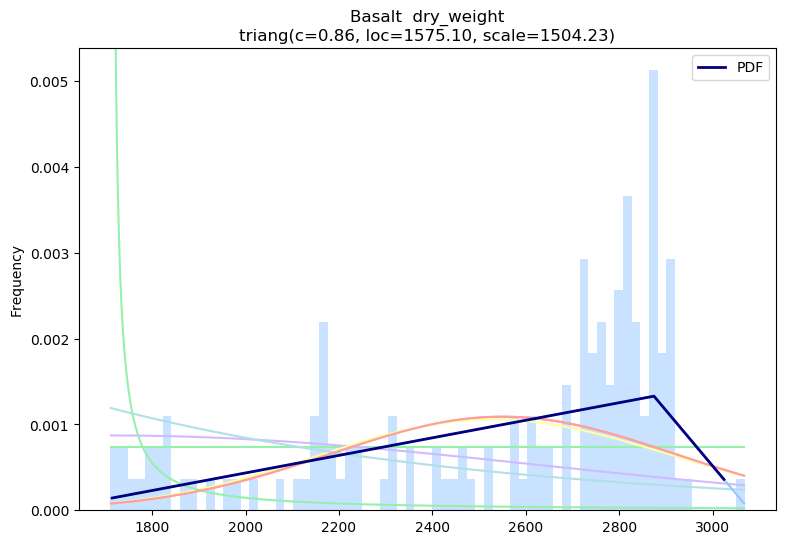

start water_cont
bins 73
Distribution found: t


<Figure size 640x480 with 0 Axes>

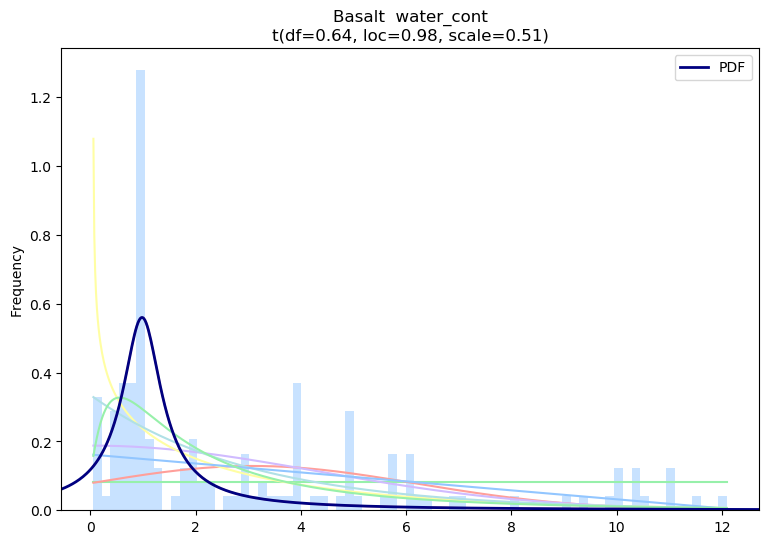

start UCS
bins 73
Distribution found: expon


<Figure size 640x480 with 0 Axes>

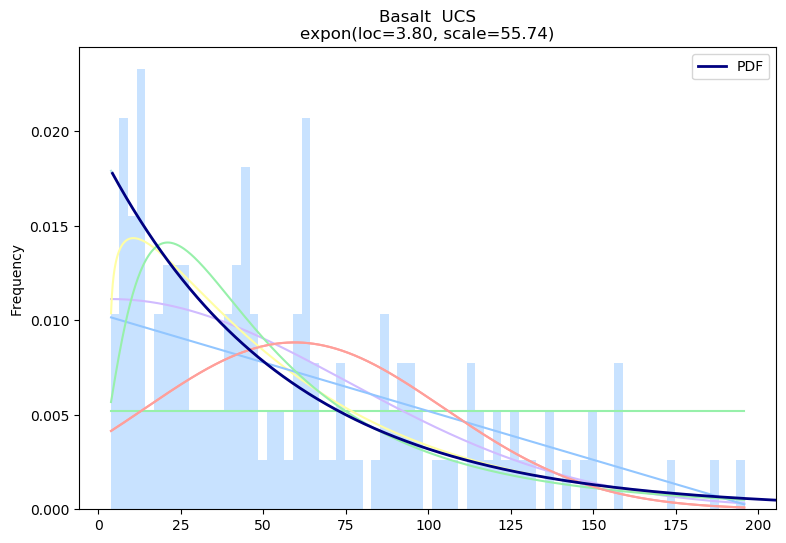

start elastic_mod
bins 73
Distribution found: triang


<Figure size 640x480 with 0 Axes>

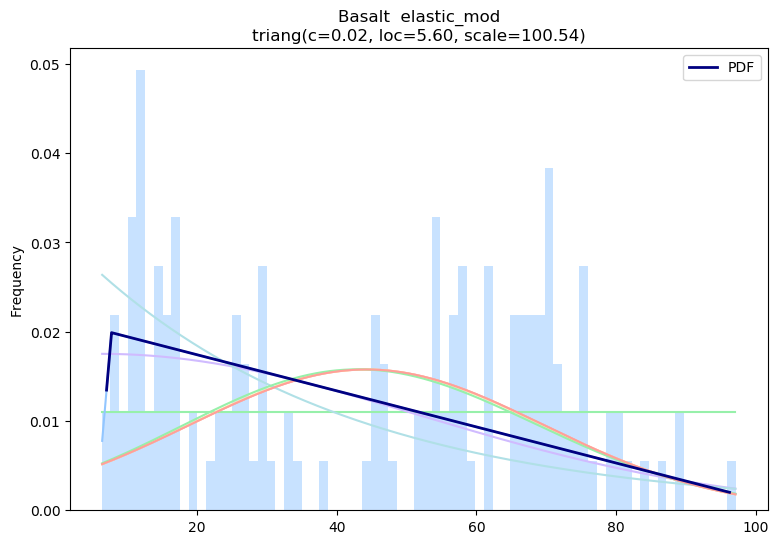

start dry_weight
bins 8
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

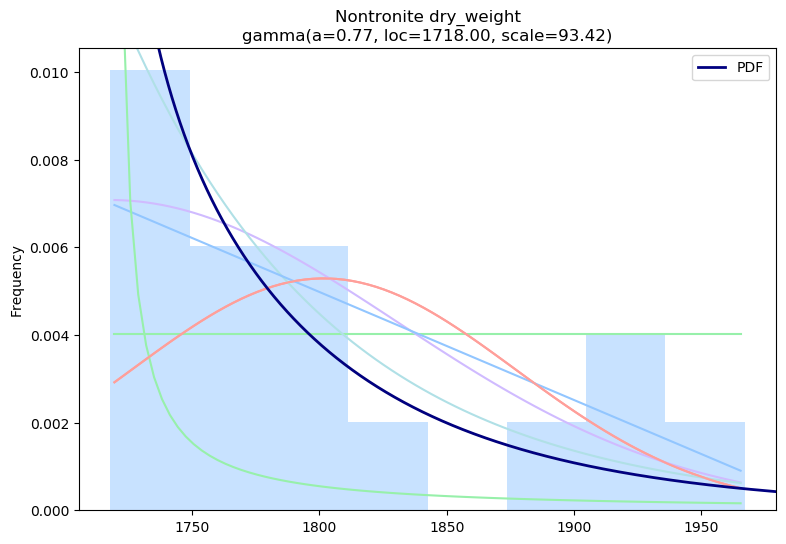

start water_cont
bins 8
Distribution found: t


<Figure size 640x480 with 0 Axes>

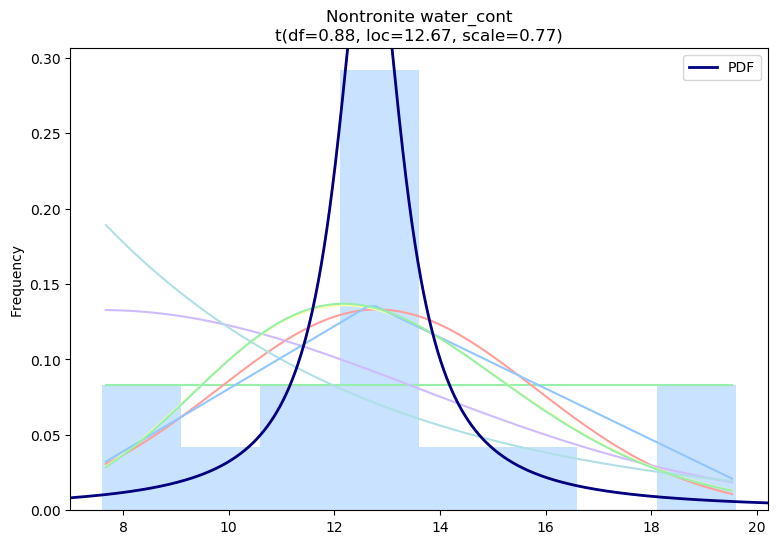

start UCS
bins 8
Distribution found: triang


<Figure size 640x480 with 0 Axes>

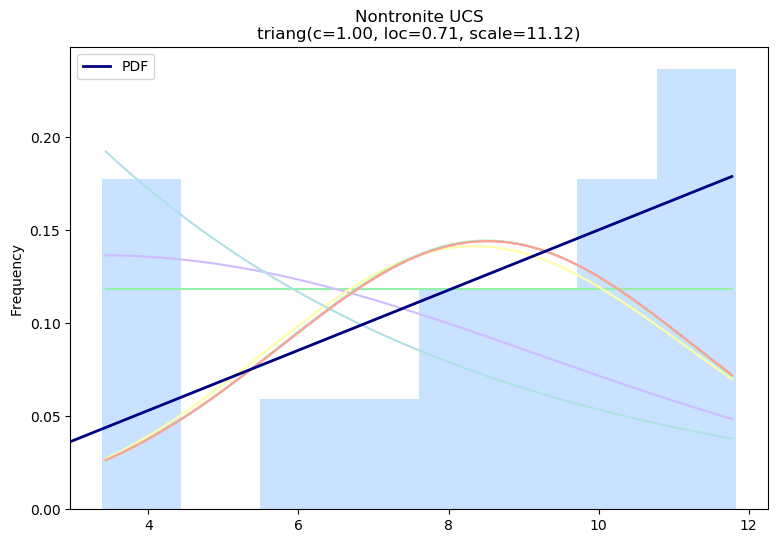

start elastic_mod
bins 8
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

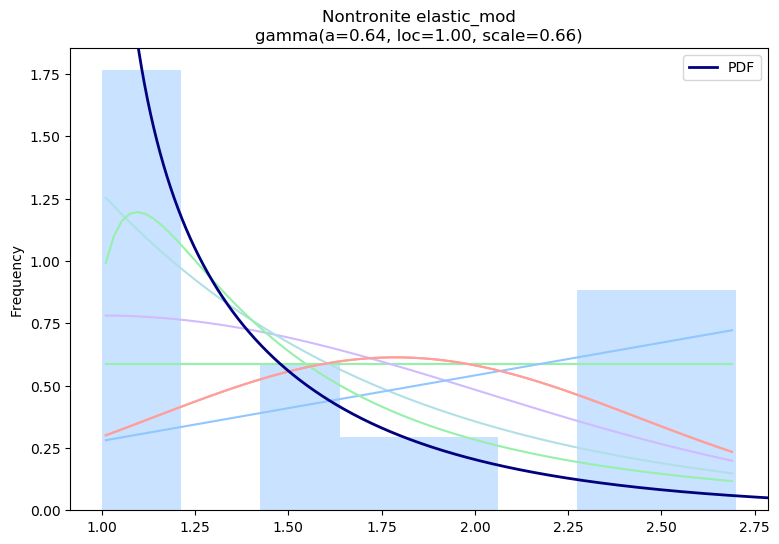

start dry_weight
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

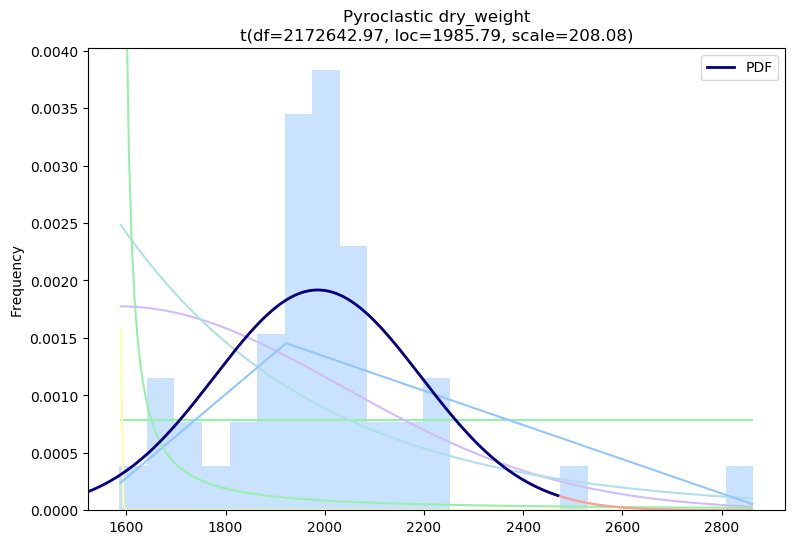

start water_cont
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

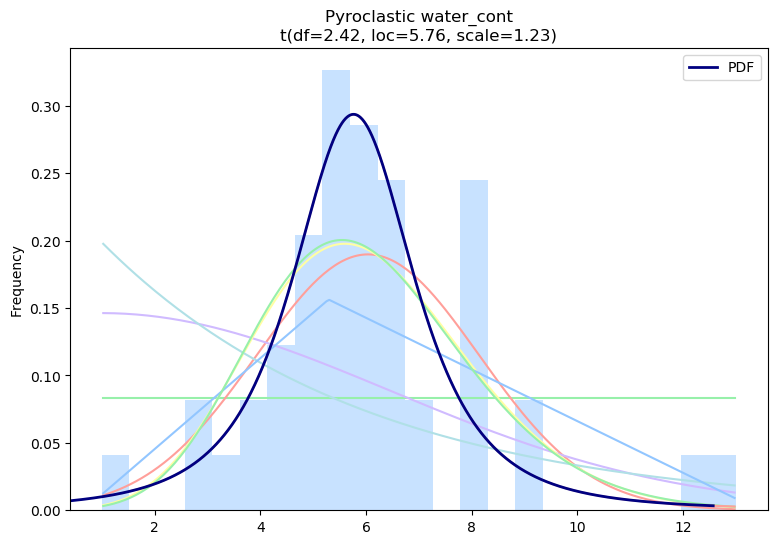

start UCS
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

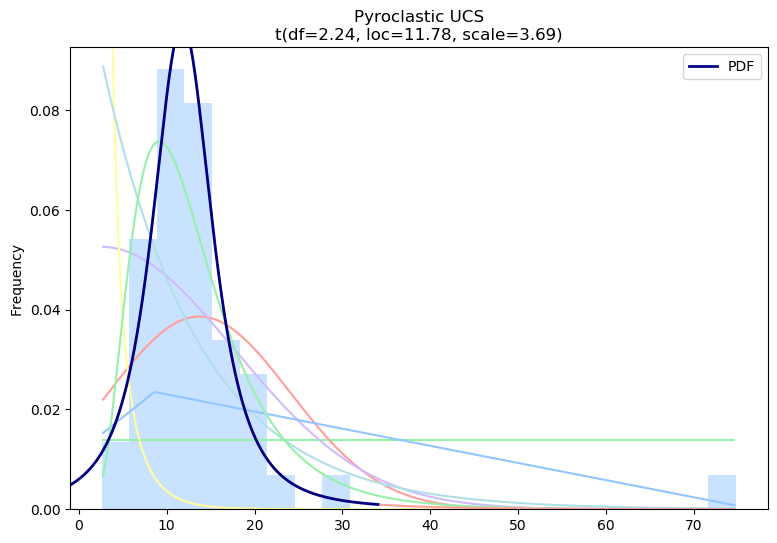

start elastic_mod
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

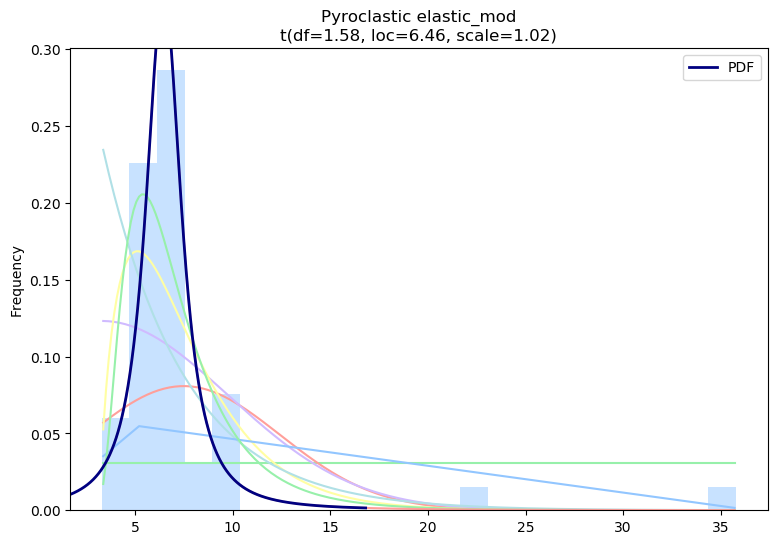

In [96]:
dict_names = {1:'Basalt ',2:'Nontronite',3:'Pyroclastic'}
dict_names2 = {0:'pyroclastic',1:'Basalt strong',2:'Nontronite',3:'Basalt strong II', 4:'Basalt Weak'}

for ee in [1,2,3]:
    
    # MUST define dfg
    
    dfg=df1[df1.type==ee].loc[:,['dry_weight','water_cont','UCS','elastic_mod']].copy()
    dfg_index = dfg.index
    n_cols = dfg.shape[1]
    
    # Load data from statsmodels datasets

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    
    ax.clear()

    with plt.style.context(("seaborn-pastel",)):

        par_dict={}

        for e in np.arange(0,n_cols,1):

            print('start '+str(dfg.iloc[:,e].name))

            data = dfg.iloc[:,e].dropna().reset_index(drop=True).copy()
            data = pd.Series(data.values.ravel())

            bins = int(len(data)/2)
            print('bins '+str(bins))

            y, x = np.histogram(data, bins=bins, density=True)
            x = (x + np.roll(x, -1))[:-1] / 2.0  #per ogni bin (x1 + x2)/2 trovo xc centroid


            # Plot for comparison all distribution lines *********
            
            plt.figure(figsize=(9,6))
            ax = data.plot(kind='hist', bins=bins, density=True, alpha=0.5)
            # Save plot limits

            dataYLim = ax.get_ylim()
            dataXLim = ax.get_xlim()   #(ax.get_xlim()[0]*0.8,ax.get_xlim()[1]*1.2)
            
            ax.set_xlabel('')
            ax.set_ylabel('Frequency')

            # Find best fit distribution
            best_fit_name, best_fit_params = best_fit_distribution(data, bins*10, ax)
            best_dist = getattr(st, best_fit_name)

            print('Distribution found: '+str(best_fit_name))
            
            
            ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)



            # Make PDF with best params 
            pdf = make_pdf(best_dist, best_fit_params)

            # Display

            
            ax = pdf.plot(lw=2, label='PDF', color='Navy', legend=True)
            
            param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
            param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
            dist_str = '{}({})'.format(best_fit_name, param_str)

            ax.set_title(dict_names[int(ee)]+' '+dfg.columns[e] + u'\n' + dist_str)

            ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)
            plt.show()
            
            
            ## Save a file
            plt.savefig('PIC//'+dict_names[int(ee)]+' '+dfg.columns[e]+'.jpg')
            
            # export a list  "par_list" with all results
            par_list = ([(k,v) for k,v in zip(param_names, best_fit_params)])
            par_dict[dfg.columns[e] + '_'+best_fit_name] = par_list               # parameters dictionary

In [97]:
 dfg=df1[df1.pred_class==0].loc[:,['dry_weight','water_cont','UCS','elastic_mod']].copy()

In [98]:
dfg.index

Int64Index([], dtype='int64')

In [99]:
df1.describe()

,index,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000
mean,114.342857,2366.957463,4.486552,45.396312,32.797776,0.214025,1.523810,6.553216
std,69.475868,430.360190,3.958360,43.968104,27.674995,0.068824,0.836891,5.184098
min,0.000000,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,0.380000
25%,52.250000,1967.000000,1.000000,11.400000,7.400000,0.174000,1.000000,2.008370
50%,120.500000,2375.187500,4.000000,25.450000,22.346818,0.222600,1.000000,4.505619
75%,175.750000,2802.000000,6.215000,65.050000,58.089503,0.250000,2.000000,10.809399
max,233.000000,3068.000000,19.600000,195.900000,97.100000,0.410000,3.000000,20.400000


start dry_weight
bins 8
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

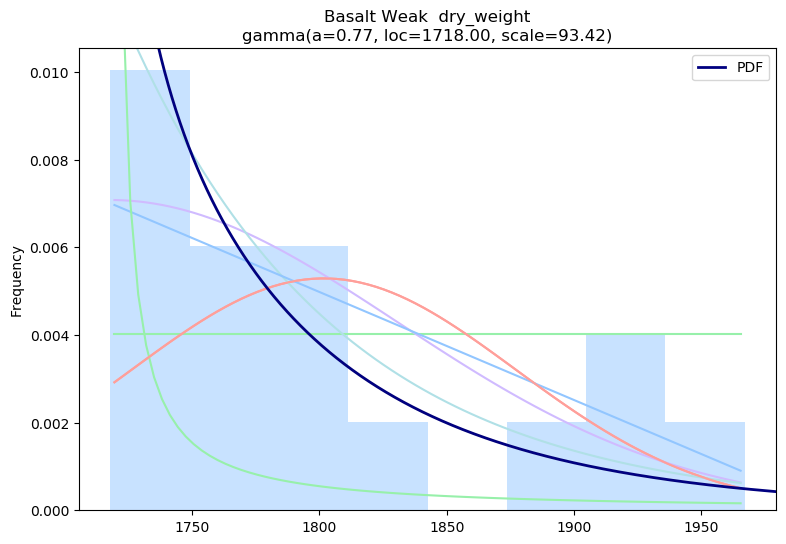

start water_cont
bins 8
Distribution found: t


<Figure size 640x480 with 0 Axes>

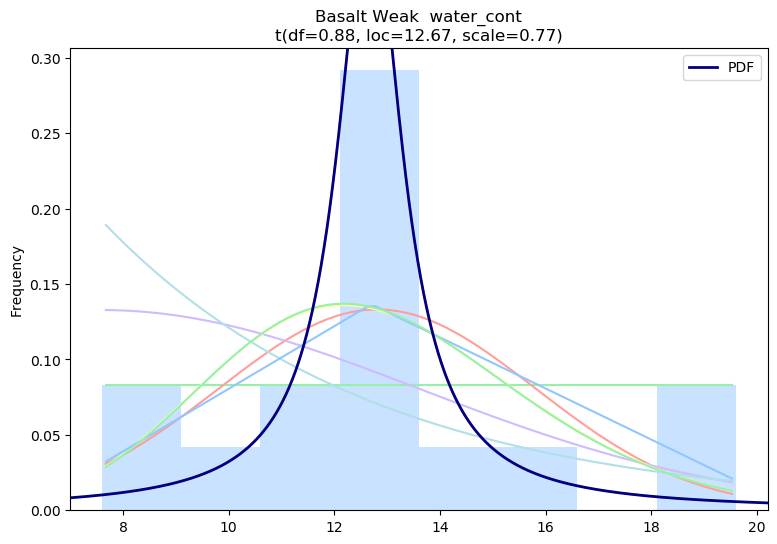

start UCS
bins 8
Distribution found: triang


<Figure size 640x480 with 0 Axes>

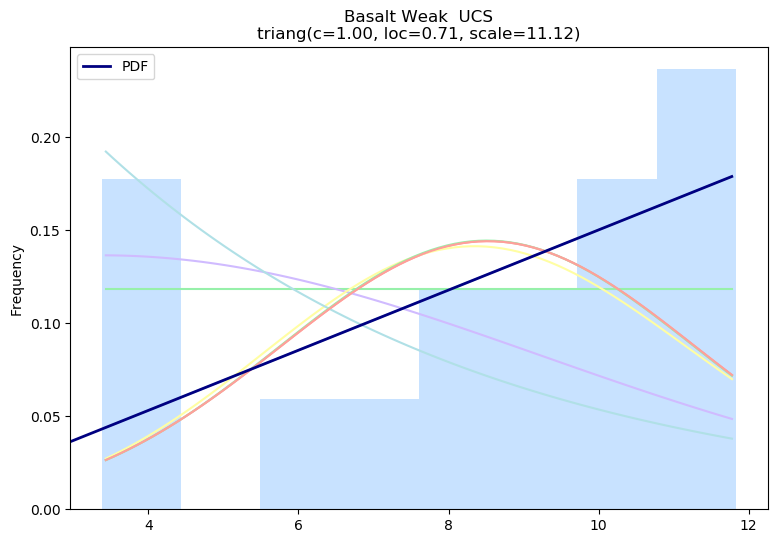

start elastic_mod
bins 8
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

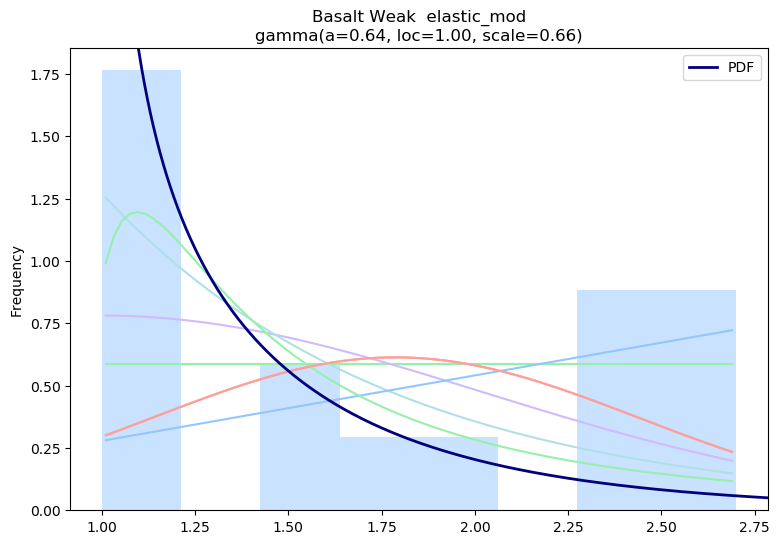

start dry_weight
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

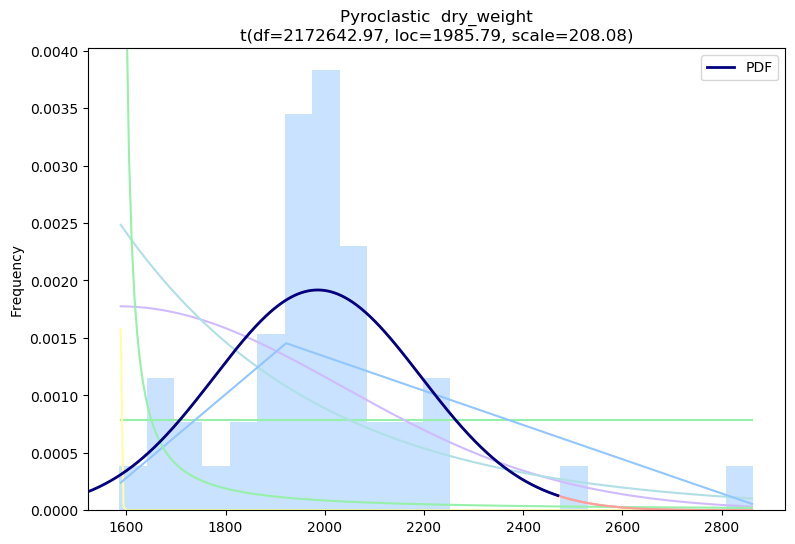

start water_cont
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

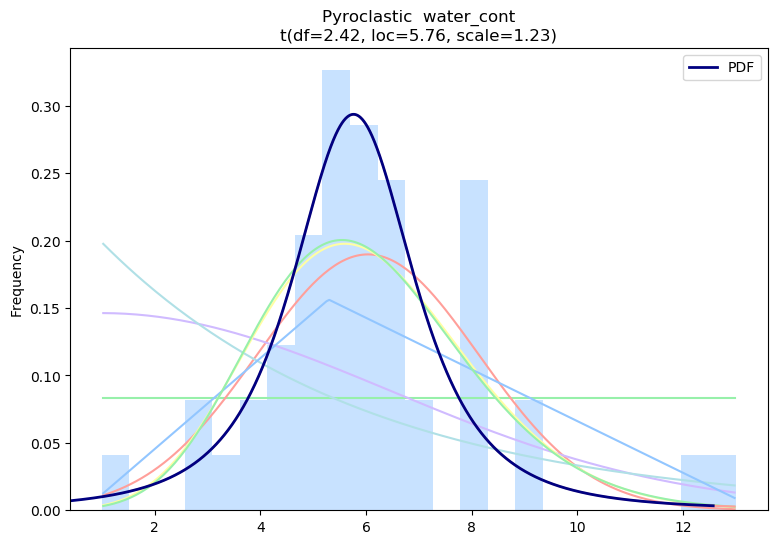

start UCS
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

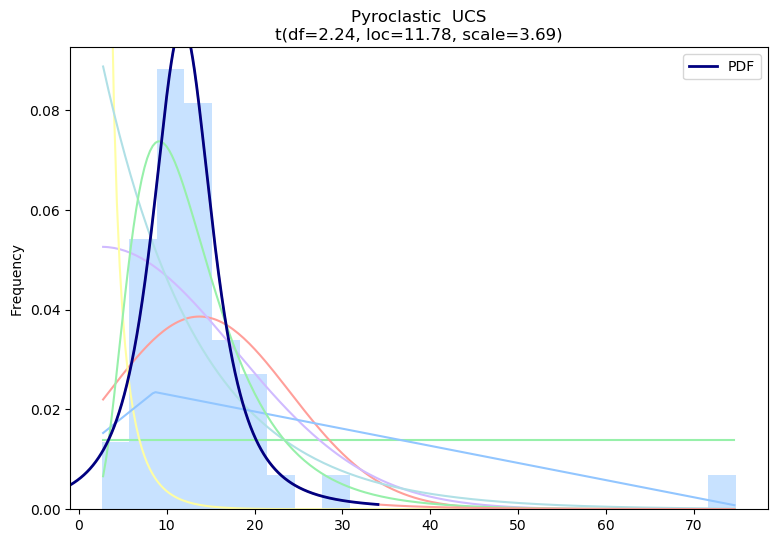

start elastic_mod
bins 23
Distribution found: t


<Figure size 640x480 with 0 Axes>

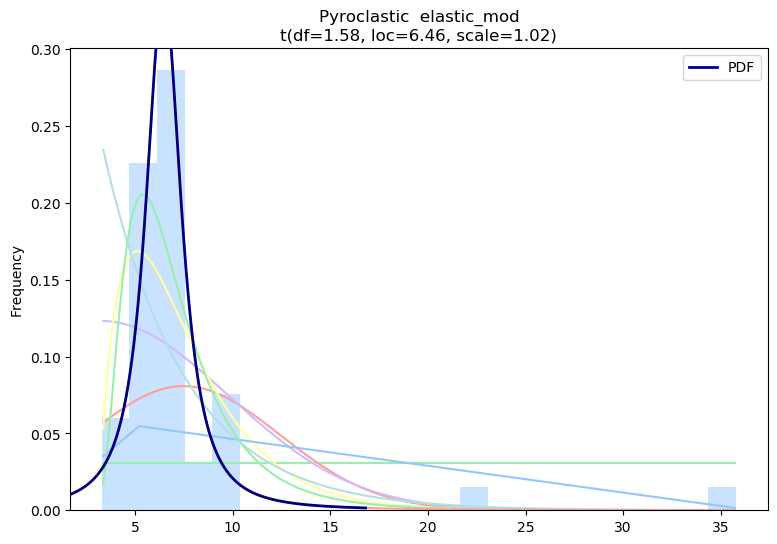

start dry_weight
bins 29
Distribution found: triang


<Figure size 640x480 with 0 Axes>

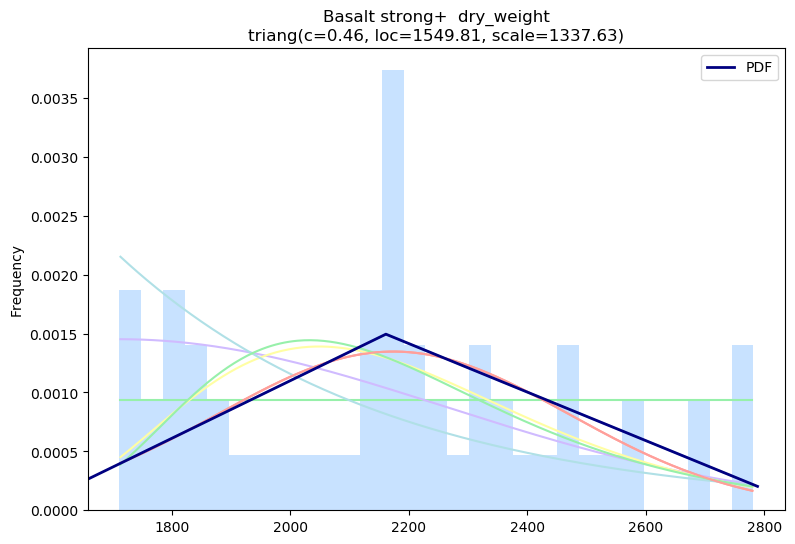

start water_cont
bins 29
Distribution found: lognorm


<Figure size 640x480 with 0 Axes>

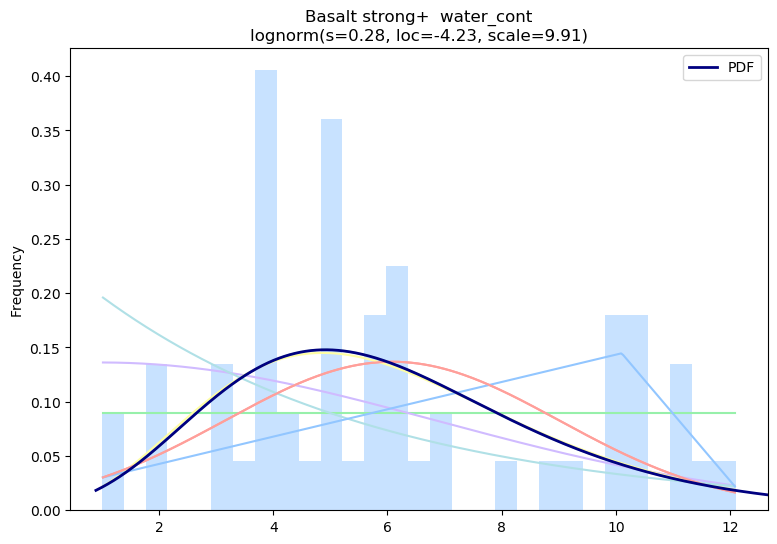

start UCS
bins 29
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

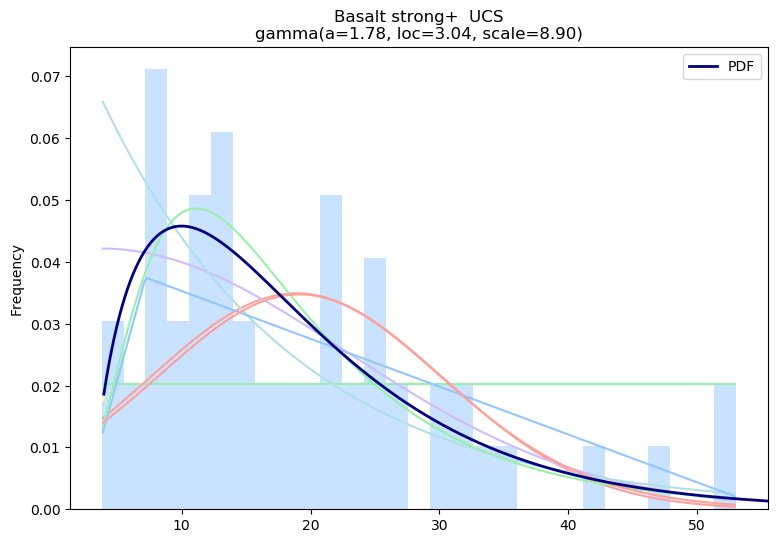

start elastic_mod
bins 29
Distribution found: triang


<Figure size 640x480 with 0 Axes>

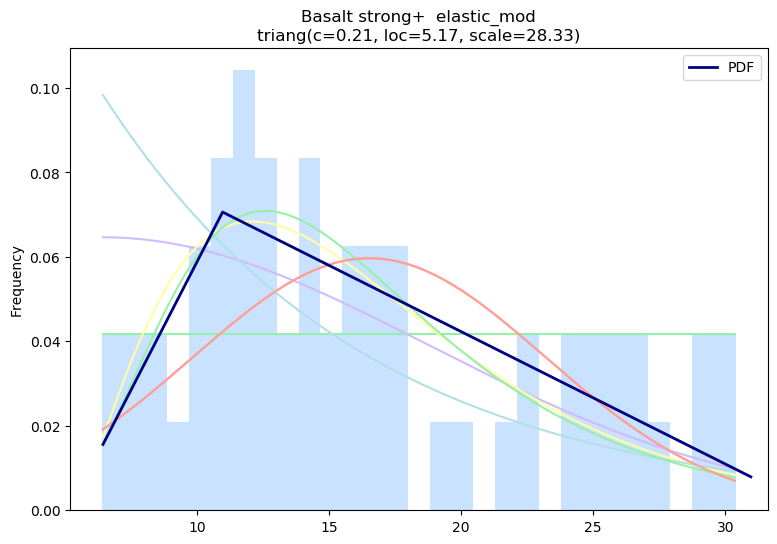

start dry_weight
bins 29
Distribution found: t


<Figure size 640x480 with 0 Axes>

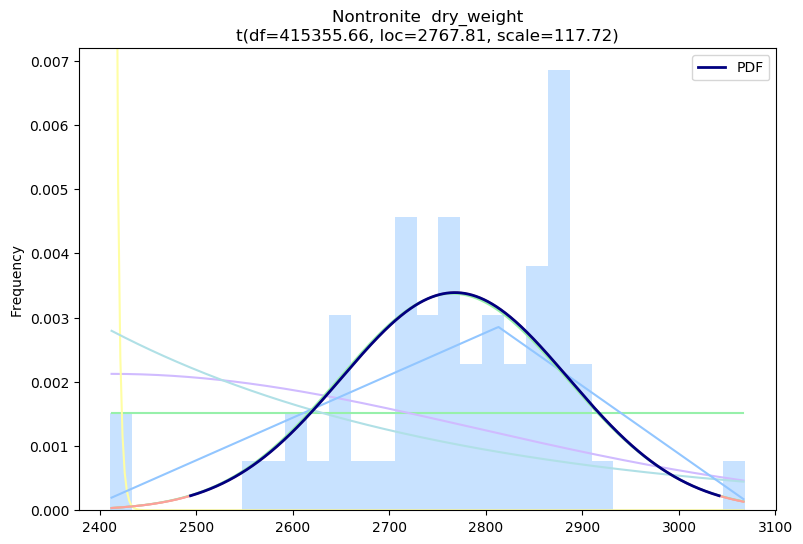

start water_cont
bins 29
Distribution found: t


<Figure size 640x480 with 0 Axes>

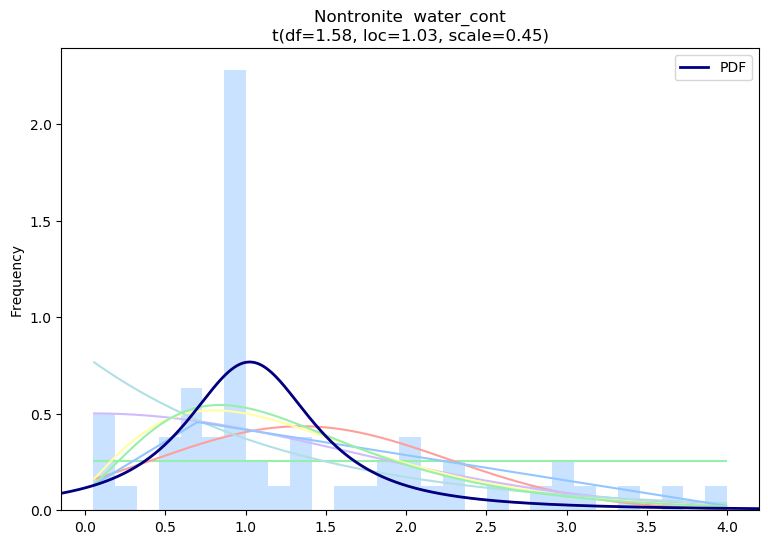

start UCS
bins 29
Distribution found: uniform


<Figure size 640x480 with 0 Axes>

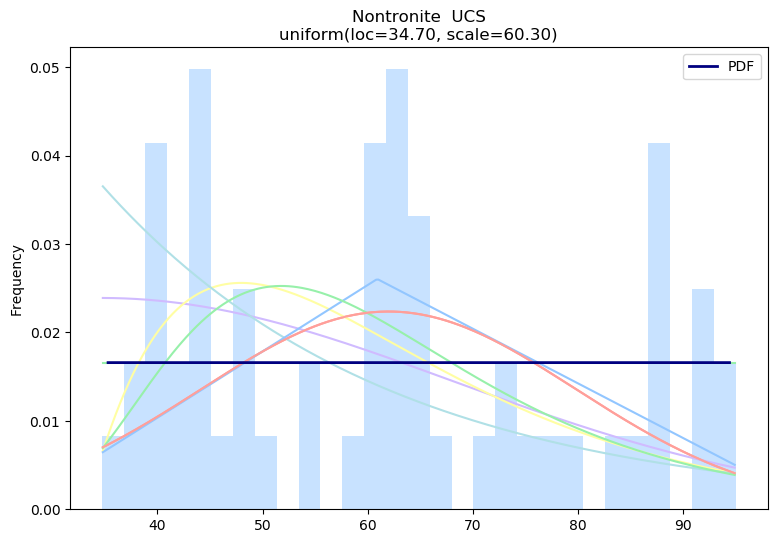

start elastic_mod
bins 29
Distribution found: triang


<Figure size 640x480 with 0 Axes>

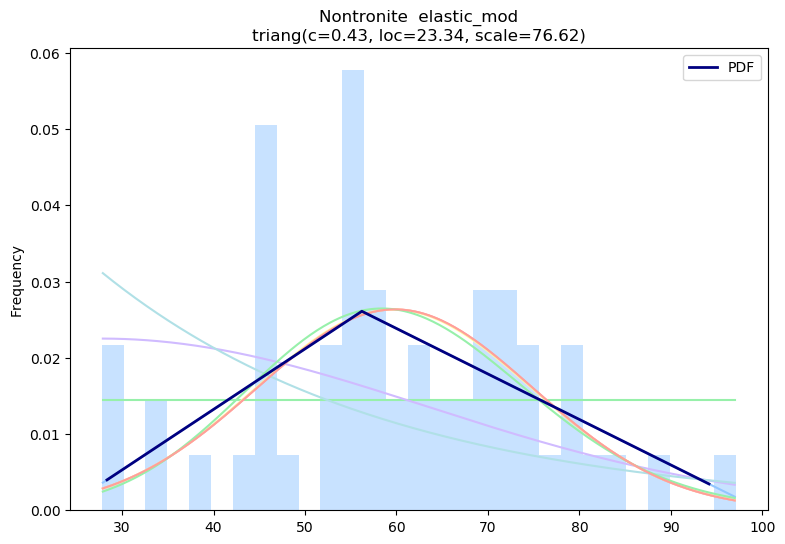

start dry_weight
bins 15
Distribution found: triang


<Figure size 640x480 with 0 Axes>

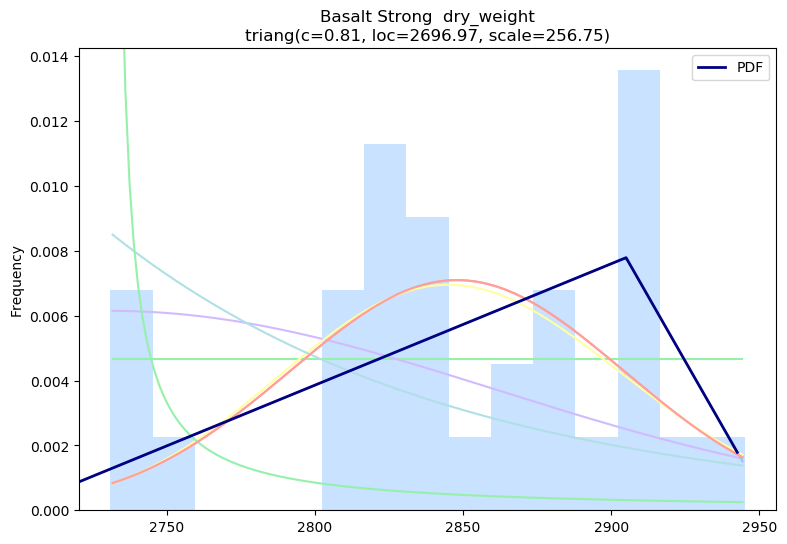

start water_cont
bins 15
Distribution found: triang


<Figure size 640x480 with 0 Axes>

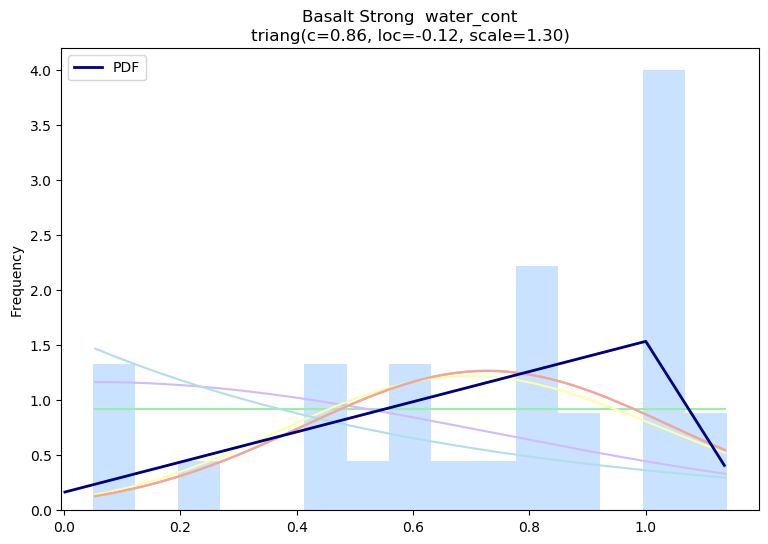

start UCS
bins 15
Distribution found: halfnorm


<Figure size 640x480 with 0 Axes>

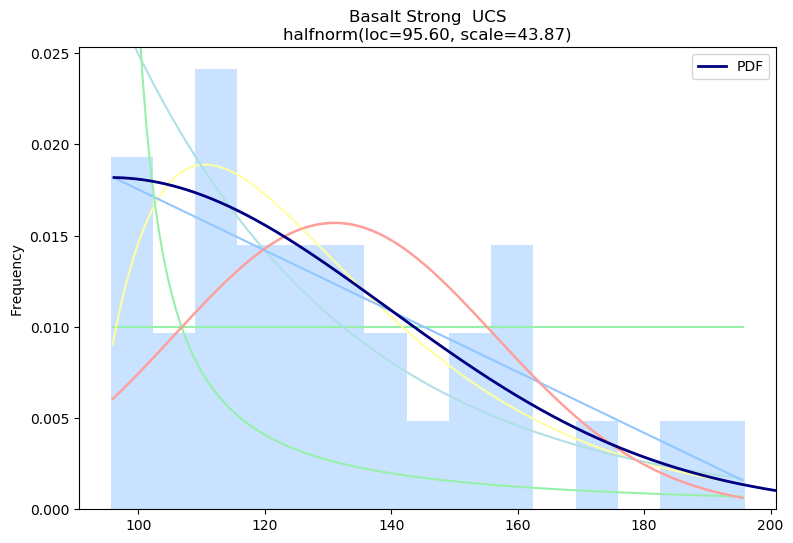

start elastic_mod
bins 15
Distribution found: t


<Figure size 640x480 with 0 Axes>

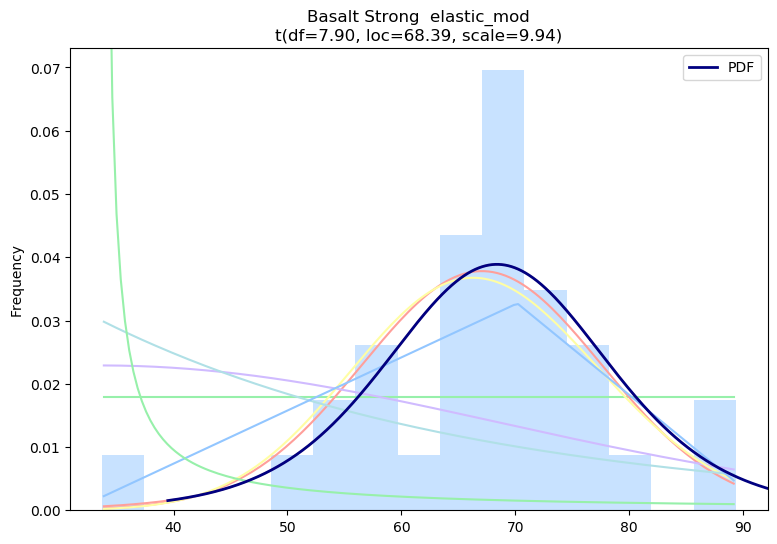

In [100]:
# ATTENZIONE I NOMI SONO SPARSI IN QUANTO IL CLASSIFICATORE NON SEGUE UN ORDINE PRECISO

# GR0  Basalt Weak
# GR1  Pyroclastic
# GR2  Basalt Strong +
# GR3  Nontronite
# GR4  Basalt Strong


dict_names = {1:'basalt',2:'nontronite',3:'pyroclastic'}
dict_names2 = {0:'pyroclastic',1:'Basalt strong',2:'Nontronite',3:'Basalt strong +', 4:'Basalt Weak'}
dict_names2 = {0:'Basalt Weak ',1:'Pyroclastic ',2:'Basalt strong+ ',3:'Nontronite ', 4:'Basalt Strong '}



list_class = df1.pred_class.unique().tolist()
list_class.sort()

for ee in list_class:
    
    # MUST define dfg
    
    dfg=df1[df1.pred_class==ee].loc[:,['dry_weight','water_cont','UCS','elastic_mod']].copy()
    
    dfg_index = dfg.index
    n_cols = dfg.shape[1]
    
    # Load data from statsmodels datasets

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    
    ax.clear()

    with plt.style.context(("seaborn-pastel",)):

        par_dict={}

        for e in np.arange(0,n_cols,1):

            print('start '+str(dfg.iloc[:,e].name))

            data = dfg.iloc[:,e].dropna().reset_index(drop=True).copy()
            data = pd.Series(data.values.ravel())

            bins = int(len(data)/2)
            print('bins '+str(bins))

            y, x = np.histogram(data, bins=bins, density=True)
            x = (x + np.roll(x, -1))[:-1] / 2.0  #per ogni bin (x1 + x2)/2 trovo xc centroid


            # Plot for comparison all distribution lines *********
            
            plt.figure(figsize=(9,6))
            ax = data.plot(kind='hist', bins=bins, density=True, alpha=0.5)
            # Save plot limits

            dataYLim = ax.get_ylim()
            dataXLim = ax.get_xlim()   #(ax.get_xlim()[0]*0.8,ax.get_xlim()[1]*1.2)
            
            ax.set_xlabel('')
            ax.set_ylabel('Frequency')

            # Find best fit distribution
            best_fit_name, best_fit_params = best_fit_distribution(data, bins*10, ax)
            best_dist = getattr(st, best_fit_name)

            print('Distribution found: '+str(best_fit_name))
            
            
            ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)



            # Make PDF with best params 
            pdf = make_pdf(best_dist, best_fit_params)

            # Display

            
            ax = pdf.plot(lw=2, label='PDF', color='Navy', legend=True)
            
            param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
            param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
            dist_str = '{}({})'.format(best_fit_name, param_str)

            ax.set_title(dict_names2[int(ee)]+' '+dfg.columns[e] + u'\n' + dist_str)

            ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)
            plt.show()
            
            
            ## Save a file
            plt.savefig('PIC//'+dict_names2[int(ee)]+' '+dfg.columns[e]+'.jpg')
            
            # export a list  "par_list" with all results
            par_list = ([(k,v) for k,v in zip(param_names, best_fit_params)])
            par_dict[dfg.columns[e] + '_'+best_fit_name] = par_list               # parameters dictionary

            

#### STATISTICHE FINALI

In [101]:
df3=df1.drop(columns='name').copy()

In [102]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 11 columns):
index          210 non-null int64
dry_weight     210 non-null float64
water_cont     210 non-null float64
UCS            210 non-null float64
elastic_mod    210 non-null float64
poisson        210 non-null float64
type           210 non-null int64
rock_type      210 non-null object
T              210 non-null float64
pred_class     210 non-null object
type_str       210 non-null object
dtypes: float64(6), int64(2), object(3)
memory usage: 18.2+ KB


In [103]:
df3.describe(include='all', percentiles=[.05,.95])

,index,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T,pred_class,type_str
count,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210.000000,210,210.000000,210,210
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,NaN,5,3
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BS,NaN,2,Basalt
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89,NaN,58,147
mean,114.342857,2366.957463,4.486552,45.396312,32.797776,0.214025,1.523810,NaN,6.553216,NaN,NaN
std,69.475868,430.360190,3.958360,43.968104,27.674995,0.068824,0.836891,NaN,5.184098,NaN,NaN
min,0.000000,1586.000000,0.050000,2.600000,1.000000,0.040000,1.000000,NaN,0.380000,NaN,NaN
5%,10.450000,1737.900000,0.448000,6.245000,2.380453,0.098570,1.000000,NaN,1.224500,NaN,NaN
50%,120.500000,2375.187500,4.000000,25.450000,22.346818,0.222600,1.000000,NaN,4.505619,NaN,NaN
95%,219.550000,2900.500000,12.469500,136.170000,76.411961,0.333370,3.000000,NaN,15.904262,NaN,NaN


In [104]:
df3.groupby('pred_class').describe(include='all', percentiles=[.05,.95])['dry_weight']

,count,unique,top,freq,mean,std,min,5%,50%,95%,max
pred_class,,,,,,,,,,,
0,16.0,NaN,NaN,NaN,1801.750000,77.873830,1718.0,1718.75,1777.5,1936.25,1967.0
1,47.0,NaN,NaN,NaN,1985.794326,210.332765,1586.0,1676.10,1987.0,2229.00,2864.0
2,58.0,NaN,NaN,NaN,2173.811063,298.704313,1711.0,1739.85,2163.5,2690.80,2782.0
3,58.0,NaN,NaN,NaN,2767.810345,118.751762,2411.0,2585.85,2782.0,2894.80,3068.0
4,31.0,NaN,NaN,NaN,2847.957816,57.146494,2731.0,2738.00,2844.0,2920.00,2945.0


In [105]:
df3.groupby('pred_class').describe(include='all', percentiles=[.05,.95])['UCS']

,count,unique,top,freq,mean,std,min,5%,50%,95%,max
pred_class,,,,,,,,,,,
0,16.0,NaN,NaN,NaN,8.523750,2.856601,3.38,3.57500,9.50,11.3575,11.83
1,47.0,NaN,NaN,NaN,13.721664,10.449933,2.60,5.99000,12.20,21.7300,74.81
2,58.0,NaN,NaN,NaN,18.892634,11.524083,3.80,5.77600,16.23,43.0000,53.00
3,58.0,NaN,NaN,NaN,61.981034,17.997651,34.70,39.30500,61.75,92.1350,95.00
4,31.0,NaN,NaN,NaN,131.008210,25.848931,95.60,97.01775,125.60,179.5000,195.90


In [106]:
df3.groupby('pred_class').describe(include='all', percentiles=[.05,.95])['elastic_mod']

,count,unique,top,freq,mean,std,min,5%,50%,95%,max
pred_class,,,,,,,,,,,
0,16.0,NaN,NaN,NaN,1.787224,0.671788,1.000000,1.000,1.583591,2.700000,2.700000
1,47.0,NaN,NaN,NaN,7.493076,4.990396,3.300000,4.190,6.600000,9.551116,35.775742
2,58.0,NaN,NaN,NaN,16.525412,6.743730,6.400000,7.800,14.811122,28.801956,30.400000
3,58.0,NaN,NaN,NaN,59.816315,15.276279,27.781634,32.945,58.000000,82.197500,97.100000
4,31.0,NaN,NaN,NaN,67.062663,10.726142,33.700000,52.150,68.331023,83.250000,89.350000


##  KMEANS CLASSIFIER  BS WEAK

In [107]:
df4 = df0[(df0.type!=3) & (df0.UCS<35)].copy()  # tolgo le pyroclastiti e UCS >35 (prima era 30MPa)
try:
    df4 = df4[['dry_weight','water_cont','UCS','elastic_mod']]
except:
    print('error occurred')

In [108]:
index_df4 = df4.index
df4_col = df4.columns
df4.head(3)

,dry_weight,water_cont,UCS,elastic_mod
3,2240.0,4.78,24.40,15.900000
4,2578.0,5.09,22.60,16.600000
6,1819.0,9.90,12.36,13.143021


In [109]:
# normalize columns  df4 will be a normalized dataframe

x = df4.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df4 = pd.DataFrame(x_scaled)
df4.columns = df4_col
df4.index =  index_df4 


In [110]:
df4.UCS *= 1              # anzich* 0.6 usato nelle precedenti predizioni
df4.elastic_mod *= 1      # 1 nelle precedenti
df4.dry_weight *= 1
df4.water_cont *= 0

In [111]:
# Loading dataset       --> df4 normalized df    --> df5 is ready to plot df

n_cluster = 5
model = KMeans(n_clusters=n_cluster)

model.fit(df4)

all_prediction= model.predict(df4)
all_prediction

array([0, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 3, 0, 0, 3, 0, 4, 3,
       3, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 3, 2,
       0, 4, 4, 2, 4, 2, 3, 4, 3, 2, 3, 0, 0, 0, 3, 3, 0, 2, 0, 4, 2, 3,
       3, 2, 2, 2])

In [112]:
# Insert classes into the main df

df5 = df0.loc[index_df4,:].copy()
df5['pred_class']=all_prediction           #insert the class calculated
df5['pred_class'] = df5['pred_class'].astype(str)  # avoid continuous color scale on pred_class

In [113]:
df5.rock_type.unique()

array(['BS-W-Ves', 'BS-W_Am', 'BS-S', 'BS-W_Nt', 'BS'], dtype=object)

In [114]:
df5.columns

Index(['index', 'name', 'dry_weight', 'water_cont', 'UCS', 'elastic_mod',
       'poisson', 'type', 'rock_type', 'T', 'pred_class'],
      dtype='object')

#### REORDER NUMBER OF GROUPS 

In [115]:
clust_cent = model.cluster_centers_     # row for each class

Rdist = []
for ii in np.arange(0,clust_cent.shape[0],1):
    R = 0   
    for ee in np.arange(2,4,1):   # only for position 2,3 UCS-mod-elast
        R += clust_cent[ii][ee]**2
    Rdist.append(np.sqrt(R))

dfgroups = pd.DataFrame({"R":Rdist}).sort_values('R').reset_index().reset_index()
neworder = []
oldorder = []
neworder = ''.join([str(elem) for elem in dfgroups.iloc[:,0].tolist()])
oldorder = ''.join([str(elem) for elem in dfgroups.iloc[:,1].tolist()])
dict_groups = dict(zip(oldorder,neworder))
dict_groups

df5['pred_class'] = df5['pred_class'].apply(lambda x: dict_groups[x])

### PLOT 

In [116]:
df5.to_csv('df5.csv')

In [117]:
# Define color sequence

color_discrete_sequence=px.colors.qualitative.G10
color_discrete_sequence=px.colors.sequential.Plasma
color_discrete_sequence=['#0d0887', '#7201a8', '#bd3786', '#ed7953', '#fdca26', '#f0f921']
color_discrete_sequence=['#0d0887', '#7201a8', '#bd3786', '#ed7953', '#f0f921']

In [118]:
symbol_sequence=[0,200,1,201,28]


labels={'elastic_mod':'E Young [GPa]','UCS':'UCS  [MPa]', 'dry_weight':'Dry weight [kg/m³]'}

In [119]:
size=df5.UCS-df5.UCS.max()/df5.UCS.max()

y="elastic_mod"
x="UCS"
fig = px.scatter(df5, x=x, y=y, color="pred_class",
                 size=size, hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6, facet_row="type",log_x=True, labels=labels, color_discrete_sequence=color_discrete_sequence)


labels={'elastic_mod':'E Young [GPa]','UCS':'UCS  [MPa]', 'dry_weight':'Dry weight [kg/m³]'}

xmin = np.log10(df5[x].min()*1.5)
xmax = np.log10(df5[x].max()*1.5)
ymin = 0
ymax = df5[y].max()*1.5

fig.update_layout(
    autosize=False,
    width=1000,
    height=700)

fig.update_xaxes(range=[xmin,xmax])
fig.update_yaxes(showline=True, linewidth=0.1, range=[ymin,ymax])


fig.show()

In [120]:
import plotly.express as px
import matplotlib
import plotly.graph_objects as go



x = "dry_weight"
y = "elastic_mod"


symbol_sequence=[0,200,1,201,28]  

size=df5.UCS-df5.UCS.max()/df5.UCS.max()

fig = px.scatter(df5, x=x, y=y, color="pred_class",symbol="rock_type",symbol_sequence=symbol_sequence,labels=labels,
                 size=size, hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6, color_discrete_sequence=color_discrete_sequence) #text="name"

xmin = df5[x].min()*0.8
xmax = df5[x].max()*1.2
ymin = df5[y].min()*0.8
ymax = df5[y].max()*1.2


fig.update_xaxes(range=[xmin, xmax])
fig.update_yaxes(showline=True, linewidth=0.1, range=[ymin, ymax])


fig.update_layout(title='Elastic modulus - dry weight - Classification',
    autosize=False,
    width=1000,
    height=500)

fig.update_layout({'legend_orientation':'v'})


fig.show()

In [121]:
x = "dry_weight"
y = "UCS"



size=df5.elastic_mod**0.4

fig = px.scatter(df5, x=x, y=y, color="pred_class",symbol="rock_type",symbol_sequence=symbol_sequence,labels=labels,
                 size=size, hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6, color_discrete_sequence=color_discrete_sequence) #text="name"

xmin = df5[x].min()*0.8
xmax = df5[x].max()*1.2
ymin = df5[y].min()*0.8
ymax = df5[y].max()*1.2


fig.update_xaxes(range=[xmin, xmax])
fig.update_yaxes(showline=True, linewidth=0.1, range=[ymin, ymax])


fig.update_layout(title='Elastic modulus - dry weight - Classification',
    autosize=False,
    width=1000,
    height=500)

fig.update_layout({'legend_orientation':'v'})


fig.show()

What is interesting from graph above is that the classification is made considering the "elastic modulus" and the "unit weight" in addition alsa the UCS is consideredeight (size of the circles) this means consistency in the classification procedure

In [122]:


size=(df5.dry_weight)**4
fig = px.scatter(df5, x="UCS", y="elastic_mod", color="pred_class",symbol="rock_type",symbol_sequence=symbol_sequence,
                 size=size, hover_name="rock_type",hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6, log_y=True, log_x=True,labels=labels, color_discrete_sequence=color_discrete_sequence)


fig.update_layout({'legend_orientation':'v'})

x1 = np.linspace(3,30,2000)
y1 = x1*1.8
y2 = x1*1
y3 = x1*0.5
y4 = x1*0.2

fig.add_scatter(x=x1, y=y1, mode="lines", line = dict(color='royalblue', width=1, dash='dash'), name='Mod_R=1800')
fig.add_scatter(x=x1, y=y2, mode="lines", line = dict(color='red', width=1, dash='dash'), name='Mod_R=1000')
fig.add_scatter(x=x1, y=y3, mode="lines", line = dict(color='green', width=1, dash='dash'), name='Mod_R=500')
fig.add_scatter(x=x1, y=y4, mode="lines", line = dict(color='grey', width=1, dash='dash'), name='Mod_R=200')

fig.show()

What is interesting from graph above is that the classification is made considering the elastic modulus UCS ratio and the unit weight (size of the circles) this means consistency in the classification procedure

In [123]:
size=(df5.dry_weight)**4
fig = px.scatter(df5, x="UCS", y="elastic_mod", color="pred_class",symbol="rock_type",symbol_sequence=symbol_sequence,
                 size=size, hover_name="rock_type",hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6,labels=labels, color_discrete_sequence=color_discrete_sequence)


fig.update_layout({'legend_orientation':'v'})

x1 = np.linspace(0.1,30,2000)
y1 = x1*1.8
y2 = x1*1
y3 = x1*0.5
y4 = x1*0.2

fig.add_scatter(x=x1, y=y1, mode="lines", line = dict(color='royalblue', width=1, dash='dash'), name='Mod_R=1800')
fig.add_scatter(x=x1, y=y2, mode="lines", line = dict(color='red', width=1, dash='dash'), name='Mod_R=1000')
fig.add_scatter(x=x1, y=y3, mode="lines", line = dict(color='green', width=1, dash='dash'), name='Mod_R=500')
fig.add_scatter(x=x1, y=y4, mode="lines", line = dict(color='grey', width=1, dash='dash'), name='Mod_R=200')

fig.show()

In [124]:
size=df5.elastic_mod
fig = px.scatter(df5, x="water_cont", y="UCS", color="pred_class",symbol="rock_type",symbol_sequence=symbol_sequence,
                 size=size, hover_data=['dry_weight','name','poisson','rock_type','type','pred_class'],
                 opacity=0.6, log_x=True,labels=labels, color_discrete_sequence=color_discrete_sequence)


# fig.update_xaxes(range=[0.7,2.3])
# fig.update_yaxes(showline=True, linewidth=0.1, range=[-10, 110])


fig.update_layout(title='UCS - water content - Classification',
    autosize=False,
    width=1000,
    height=500)



fig.update_layout({'legend_orientation':'v'})

fig.show()

In [125]:
df4['UCS_log'] = df0.UCS.map(lambda x: np.log10(x))
df4['ela_log'] = df0.elastic_mod.map(lambda x: np.log10(x))
df4['dry_log'] = df0.dry_weight.map(lambda x: np.log10(x))
df4['UCS_log_u'] = df4.UCS_log.map(lambda x: (x-df4.UCS_log.min())/(df4.UCS_log.max()-df4.UCS_log.min()))
df4['ela_log_u'] = df4.ela_log.map(lambda x: (x-df4.ela_log.min())/(df4.ela_log.max()-df4.ela_log.min()))
df4['dry_log_u'] = df4.dry_log.map(lambda x: (x-df4.dry_log.min())/(df4.dry_log.max()-df4.dry_log.min()))

In [126]:
fig = px.scatter_ternary(df4, a="UCS", b="dry_weight", c="elastic_mod",
                         color=all_prediction.astype('str'), size='UCS', opacity=0.6, 
                         color_discrete_sequence=color_discrete_sequence)

fig.add_scatterternary(mode="markers",marker=dict(
                           size=8, line_color="midnightblue", line_width=1, symbol=33))
fig.show()

In [127]:
size=(df5.dry_weight)**0.8
fig = px.scatter(df5, x="UCS", y="elastic_mod", color="rock_type",symbol_sequence=symbol_sequence,text='pred_class',
                 size=size, hover_name="rock_type",hover_data=['name','type'],
                 opacity=0.6, labels=labels, color_discrete_sequence=color_discrete_sequence)


x1 = np.linspace(0.1,30,2000)
y1 = x1*1.8
y2 = x1*1
y3 = x1*0.5
y4 = x1*0.2

fig.add_scatter(x=x1, y=y1, mode="lines", line = dict(color='royalblue', width=1, dash='dash'), name='Mod_R=1800')
fig.add_scatter(x=x1, y=y2, mode="lines", line = dict(color='red', width=1, dash='dash'), name='Mod_R=1000')
fig.add_scatter(x=x1, y=y3, mode="lines", line = dict(color='green', width=1, dash='dash'), name='Mod_R=500')
fig.add_scatter(x=x1, y=y4, mode="lines", line = dict(color='grey', width=1, dash='dash'), name='Mod_R=200')


fig.update_layout({'legend_orientation':'v'})


fig.show()

### STATISTICS AND DISTRIBUTIONS

In [128]:
stat1 = rp.summary_cont(df1[['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat1['CV'] = stat1.SD/stat1.Mean
stat1['CV*'] = stat1.CV*(1+1/4/stat1.N)
stat1

,Variable,N,Mean,SD,SE,95% Conf.,Interval,CV,CV*
0,dry_weight,210.0,2366.957463,430.360190,29.697675,2308.412078,2425.502849,0.181820,0.182036
1,water_cont,210.0,4.486552,3.958360,0.273153,3.948065,5.025040,0.882272,0.883322
2,elastic_mod,210.0,32.797776,27.674995,1.909756,29.032922,36.562630,0.843807,0.844812
3,UCS,210.0,45.396312,43.968104,3.034087,39.414974,51.377650,0.968539,0.969692
4,T,210.0,6.553216,5.184098,0.357737,5.847981,7.258451,0.791077,0.792019


### Second Classification classification after KMEANS classificator

In [129]:
classe = "0"
descr = df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat0 = stat

In [130]:
classe = "1"
descr = df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat1 = stat

In [131]:
classe = "2"
descr = df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat2 = stat

In [132]:
classe = "3"
descr = df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat3 = stat

In [133]:
classe = "4"
descr = df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df5[df5.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat4 = stat

In [134]:
stat0

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,0,Dry weight [kg/m³],16.0,1801.75,77.87,19.47,1760.25,1843.25,0.04,1718.00,1967.00
1,0,Water content [%],16.0,12.81,3.10,0.77,11.16,14.46,0.24,7.60,19.60
2,0,E Young [GPa],16.0,1.79,0.67,0.17,1.43,2.15,0.38,1.00,2.70
3,0,UCS [MPa],16.0,8.52,2.86,0.71,7.00,10.05,0.34,3.38,11.83
4,0,Tensile Strenght [MPa],16.0,1.73,0.30,0.07,1.58,1.89,0.17,1.41,2.27


In [135]:
stat1

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,1,Dry weight [kg/m³],18.0,1821.06,78.47,18.50,1782.03,1860.08,0.04,1711.00,1975.00
1,1,Water content [%],18.0,9.83,1.58,0.37,9.04,10.62,0.16,6.20,12.10
2,1,E Young [GPa],18.0,13.87,4.11,0.97,11.82,15.91,0.30,10.97,25.80
3,1,UCS [MPa],18.0,9.29,3.10,0.73,7.75,10.83,0.33,3.80,13.68
4,1,Tensile Strenght [MPa],18.0,1.60,0.65,0.15,1.27,1.92,0.41,0.94,3.93


In [136]:
stat2

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,2,Dry weight [kg/m³],12.0,2191.08,116.36,33.59,2117.15,2265.01,0.05,2018.00,2446.00
1,2,Water content [%],12.0,5.29,0.97,0.28,4.67,5.90,0.18,3.00,6.83
2,2,E Young [GPa],12.0,11.74,5.83,1.68,8.04,15.45,0.50,6.40,24.60
3,2,UCS [MPa],12.0,11.74,3.51,1.01,9.51,13.97,0.30,5.30,17.30
4,2,Tensile Strenght [MPa],12.0,2.87,0.93,0.27,2.28,3.46,0.32,1.65,4.72


In [137]:
stat3

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,3,Dry weight [kg/m³],13.0,2204.92,68.73,19.06,2163.39,2246.46,0.03,2140.00,2324.00
1,3,Water content [%],13.0,4.99,1.06,0.29,4.34,5.63,0.21,3.25,7.00
2,3,E Young [GPa],13.0,15.66,4.69,1.30,12.83,18.50,0.30,8.67,27.40
3,3,UCS [MPa],13.0,22.39,4.27,1.19,19.81,24.98,0.19,17.00,31.60
4,3,Tensile Strenght [MPa],13.0,4.06,1.75,0.49,3.01,5.12,0.43,1.61,8.64


In [138]:
stat4

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,4,Dry weight [kg/m³],11.0,2629.88,140.74,42.43,2535.33,2724.43,0.05,2344.00,2782.00
1,4,Water content [%],11.0,2.60,1.43,0.43,1.63,3.56,0.55,1.00,5.09
2,4,E Young [GPa],11.0,25.76,8.19,2.47,20.26,31.27,0.32,14.20,45.60
3,4,UCS [MPa],11.0,27.47,4.85,1.46,24.21,30.72,0.18,22.30,34.70
4,4,Tensile Strenght [MPa],11.0,8.24,3.93,1.19,5.60,10.89,0.48,4.28,18.15


In [139]:
df5.pred_class.unique()

array(['3', '4', '1', '2', '0'], dtype=object)

In [140]:
### RAGGRUPPA 3 CON 4

In [141]:
df6=df5.copy()

In [142]:
df6.describe()

,index,dry_weight,water_cont,UCS,elastic_mod,poisson,type,T
count,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000,70.000000
mean,100.128571,2078.466667,7.696571,14.825063,12.945151,0.200754,1.228571,3.349004
std,75.256262,312.119353,4.140275,8.235151,8.953135,0.086212,0.422944,2.898626
min,3.000000,1711.000000,1.000000,3.380000,1.000000,0.040000,1.000000,0.940000
25%,45.250000,1798.500000,4.925000,8.382500,6.825000,0.140750,1.000000,1.553044
50%,67.500000,2043.500000,6.285000,11.949000,12.074439,0.196800,1.000000,2.228282
75%,179.750000,2229.500000,10.810000,20.975000,17.133921,0.253150,1.000000,4.415000
max,231.000000,2782.000000,19.600000,34.700000,45.600000,0.410000,2.000000,18.150000


### RAGGRUPPO 4 E 3

In [143]:
df6.loc[df6.pred_class=='4','pred_class']='3'

In [144]:
df6

,index,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T,pred_class
3,3,BS - 4,2240.0,4.78,24.40,15.900000,0.1800,1,BS-W-Ves,5.146086,3
4,4,BS - 5,2578.0,5.09,22.60,16.600000,0.3900,1,BS-W-Ves,6.629644,3
6,6,BS - 19,1819.0,9.90,12.36,13.143021,0.2848,1,BS-W_Am,1.459201,1
7,7,BS - 20,1780.0,10.30,10.23,14.641223,0.2900,1,BS-W_Am,1.470755,1
8,8,BS - 21,1739.0,10.00,8.03,11.487622,0.3292,1,BS-W_Am,1.438925,1
...,...,...,...,...,...,...,...,...,...,...,...
196,217,BHA-123,2120.0,5.00,13.20,6.500000,0.1800,1,BS,2.630000,2
197,218,BHA-124,2161.0,5.00,14.10,10.867449,0.1822,1,BS,2.940000,2
201,222,BHA-128,2782.0,1.00,22.30,25.226509,0.2358,1,BS,10.870000,3
204,228,BHA-134,2742.0,1.00,34.70,45.600000,0.1700,1,BS,11.640000,3


In [145]:
df6.shape

(70, 11)

In [146]:
classe = "0"
descr = df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat0 = stat

In [147]:
classe = "1"
descr = df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat1 = stat

In [148]:
classe = "2"
descr = df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat2 = stat

In [149]:
classe = "3"
descr = df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']].describe().T
stat = rp.summary_cont(df6[df6.pred_class==classe][['dry_weight','water_cont', 'elastic_mod','UCS','T']])
stat['CV'] = stat.SD/stat.Mean
# stat['CV*'] = stat.CV*(1+1/4/stat.N)
stat['Min'] = np.array(descr['min'])
stat['Max'] = np.array(descr['max'])
stat['Variable'] = ['Dry weight [kg/m³]','Water content [%]','E Young [GPa]','UCS [MPa]','Tensile Strenght [MPa]']
stat.columns = ['Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']
stat['Group']=classe
stat = stat[['Group','Variable', 'N', 'Mean', 'SD', 'SE', '95% CI inf', '95% CI sup', 'CV', 'Min', 'Max']].round(2)
stat3 = stat

# CLASSI FINALI

In [150]:
stat0  # Nontronite pred_class=1

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,0,Dry weight [kg/m³],16.0,1801.75,77.87,19.47,1760.25,1843.25,0.04,1718.00,1967.00
1,0,Water content [%],16.0,12.81,3.10,0.77,11.16,14.46,0.24,7.60,19.60
2,0,E Young [GPa],16.0,1.79,0.67,0.17,1.43,2.15,0.38,1.00,2.70
3,0,UCS [MPa],16.0,8.52,2.86,0.71,7.00,10.05,0.34,3.38,11.83
4,0,Tensile Strenght [MPa],16.0,1.73,0.30,0.07,1.58,1.89,0.17,1.41,2.27


In [151]:
stat1  # Amygdaloidal pred_class=2

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,1,Dry weight [kg/m³],18.0,1821.06,78.47,18.50,1782.03,1860.08,0.04,1711.00,1975.00
1,1,Water content [%],18.0,9.83,1.58,0.37,9.04,10.62,0.16,6.20,12.10
2,1,E Young [GPa],18.0,13.87,4.11,0.97,11.82,15.91,0.30,10.97,25.80
3,1,UCS [MPa],18.0,9.29,3.10,0.73,7.75,10.83,0.33,3.80,13.68
4,1,Tensile Strenght [MPa],18.0,1.60,0.65,0.15,1.27,1.92,0.41,0.94,3.93


In [152]:
stat2 # vesicular  pred_class=3

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,2,Dry weight [kg/m³],12.0,2191.08,116.36,33.59,2117.15,2265.01,0.05,2018.00,2446.00
1,2,Water content [%],12.0,5.29,0.97,0.28,4.67,5.90,0.18,3.00,6.83
2,2,E Young [GPa],12.0,11.74,5.83,1.68,8.04,15.45,0.50,6.40,24.60
3,2,UCS [MPa],12.0,11.74,3.51,1.01,9.51,13.97,0.30,5.30,17.30
4,2,Tensile Strenght [MPa],12.0,2.87,0.93,0.27,2.28,3.46,0.32,1.65,4.72


In [153]:
stat3 # weak     pred_class=4

,Group,Variable,N,Mean,SD,SE,95% CI inf,95% CI sup,CV,Min,Max
0,3,Dry weight [kg/m³],24.0,2399.69,240.54,49.10,2298.12,2501.27,0.10,2140.00,2782.00
1,3,Water content [%],24.0,3.89,1.72,0.35,3.16,4.62,0.44,1.00,7.00
2,3,E Young [GPa],24.0,20.29,8.19,1.67,16.83,23.75,0.40,8.67,45.60
3,3,UCS [MPa],24.0,24.72,5.14,1.05,22.55,26.89,0.21,17.00,34.70
4,3,Tensile Strenght [MPa],24.0,5.98,3.59,0.73,4.47,7.49,0.60,1.61,18.15


In [154]:
stat0.to_excel("TABOUT/stat00.xlsx")
stat1.to_excel("TABOUT/stat11.xlsx")
stat2.to_excel("TABOUT/stat22.xlsx")
stat3.to_excel("TABOUT/stat33.xlsx")

start dry_weight
bins 16
Distribution found: lognorm


<Figure size 640x480 with 0 Axes>

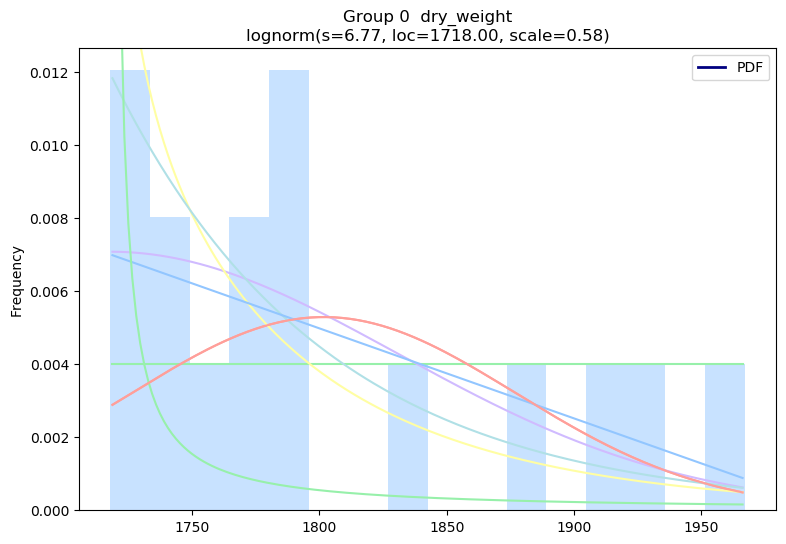

start water_cont
bins 16
Distribution found: t


<Figure size 640x480 with 0 Axes>

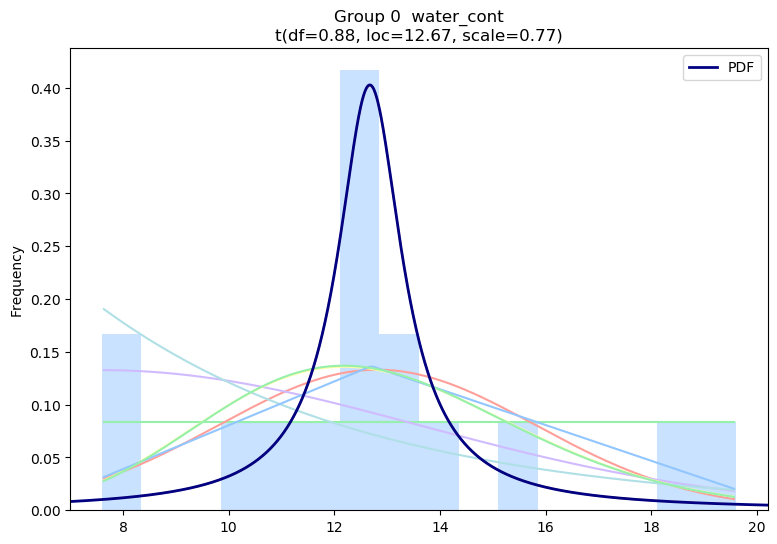

start UCS
bins 16
Distribution found: triang


<Figure size 640x480 with 0 Axes>

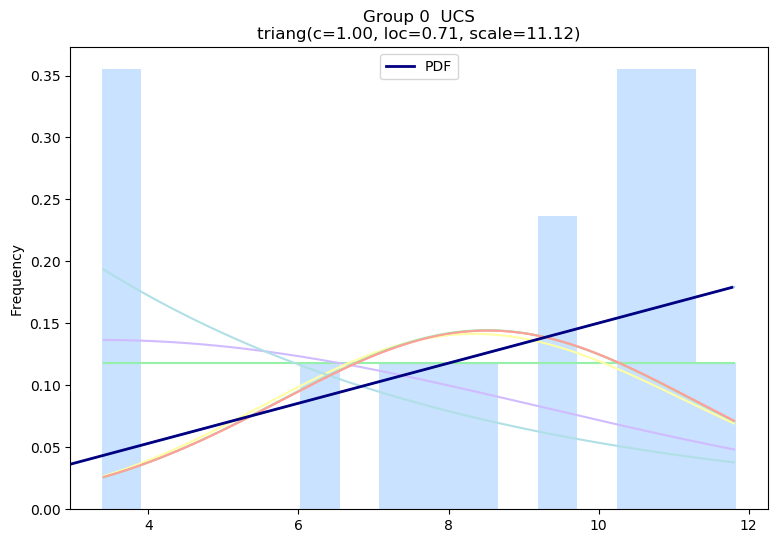

start elastic_mod
bins 16
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

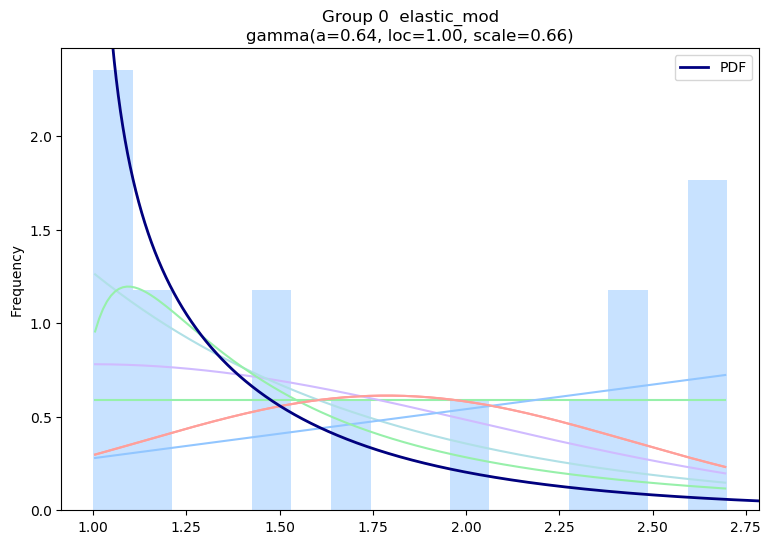

start dry_weight
bins 18
Distribution found: halfnorm


<Figure size 640x480 with 0 Axes>

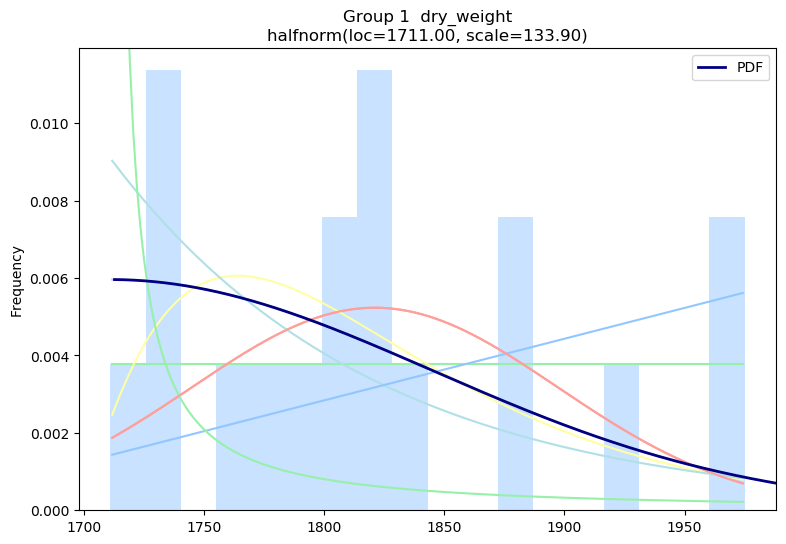

start water_cont
bins 18
Distribution found: t


<Figure size 640x480 with 0 Axes>

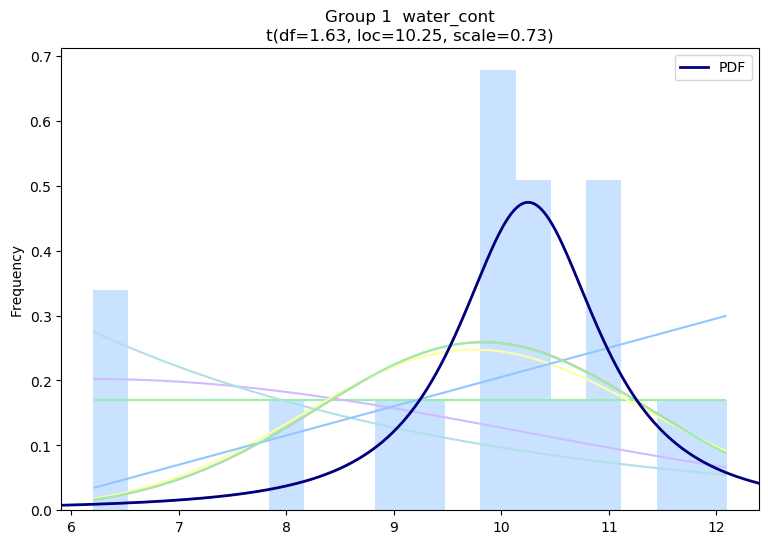

start UCS
bins 18
Distribution found: lognorm


<Figure size 640x480 with 0 Axes>

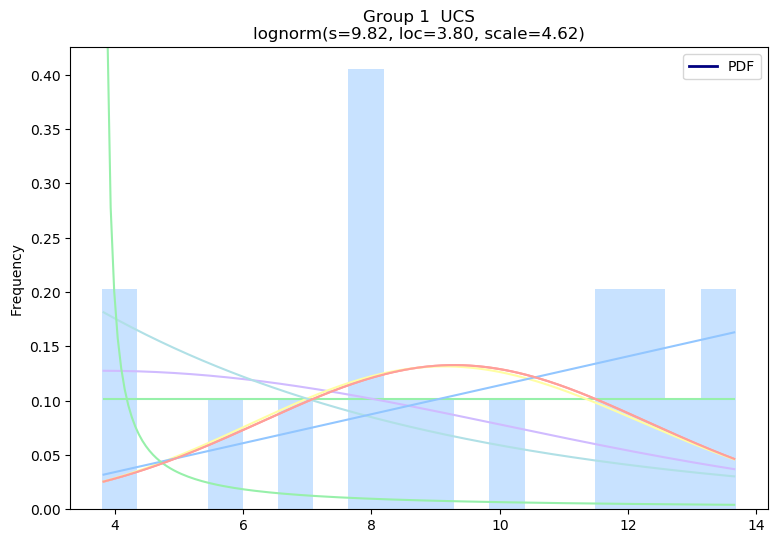

start elastic_mod
bins 18
Distribution found: lognorm


<Figure size 640x480 with 0 Axes>

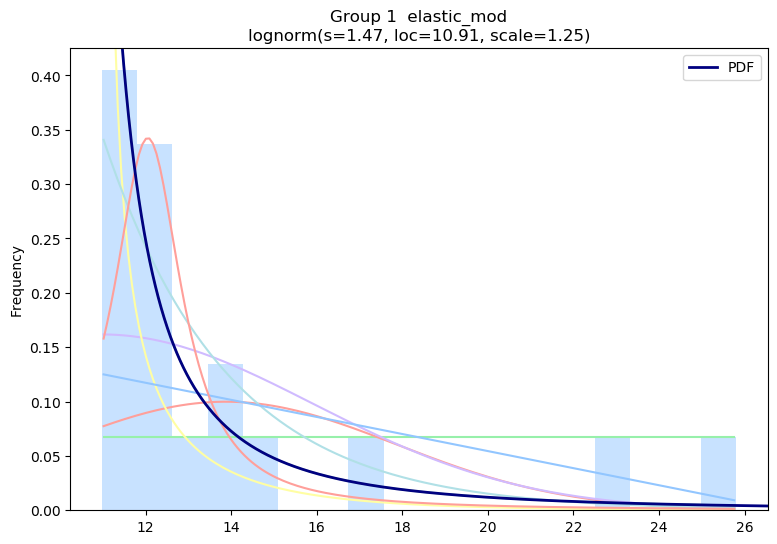

start dry_weight
bins 12
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

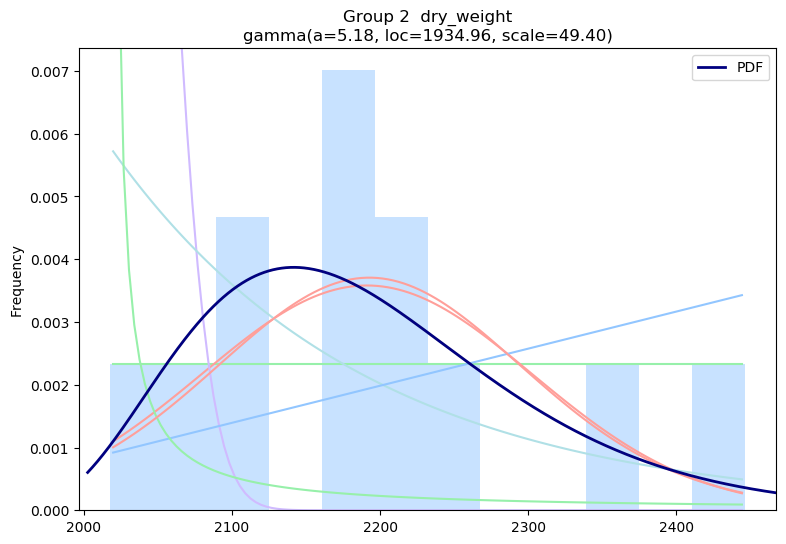

start water_cont
bins 12
Distribution found: t


<Figure size 640x480 with 0 Axes>

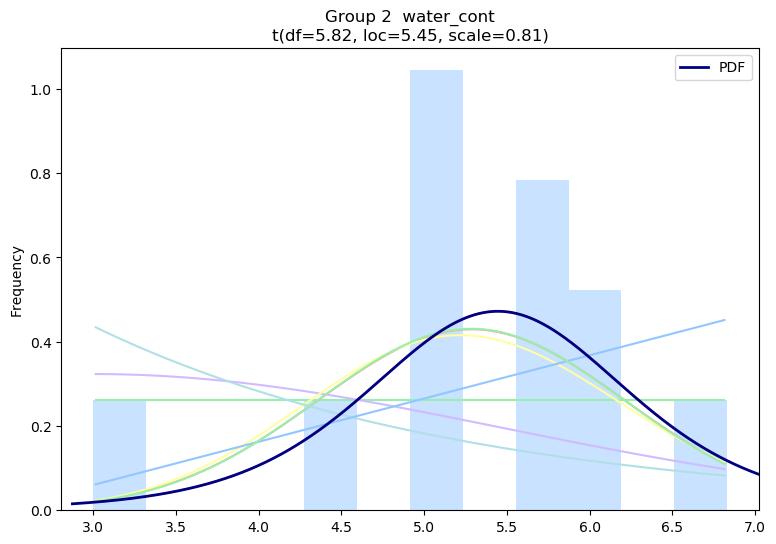

start UCS
bins 12
Distribution found: uniform


<Figure size 640x480 with 0 Axes>

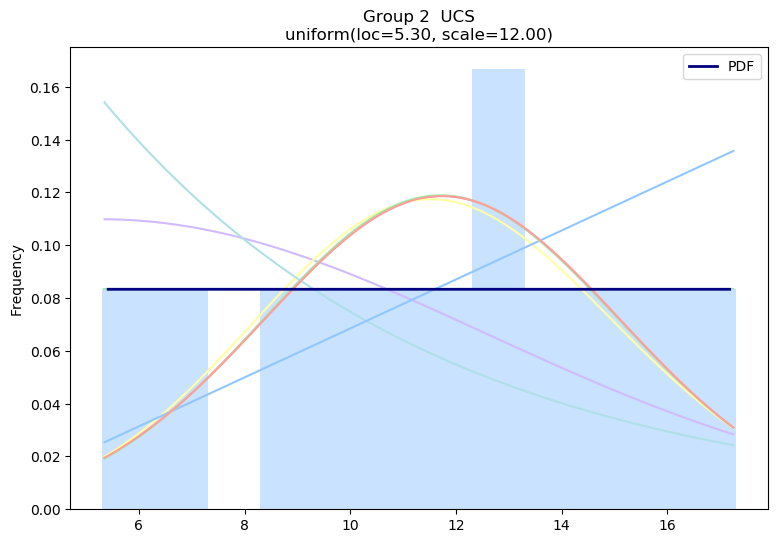

start elastic_mod
bins 12
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

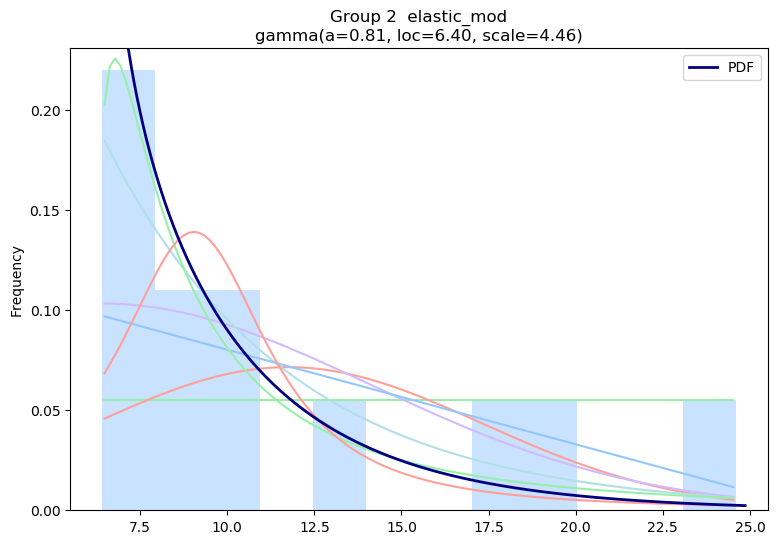

start dry_weight
bins 24
Distribution found: gamma


<Figure size 640x480 with 0 Axes>

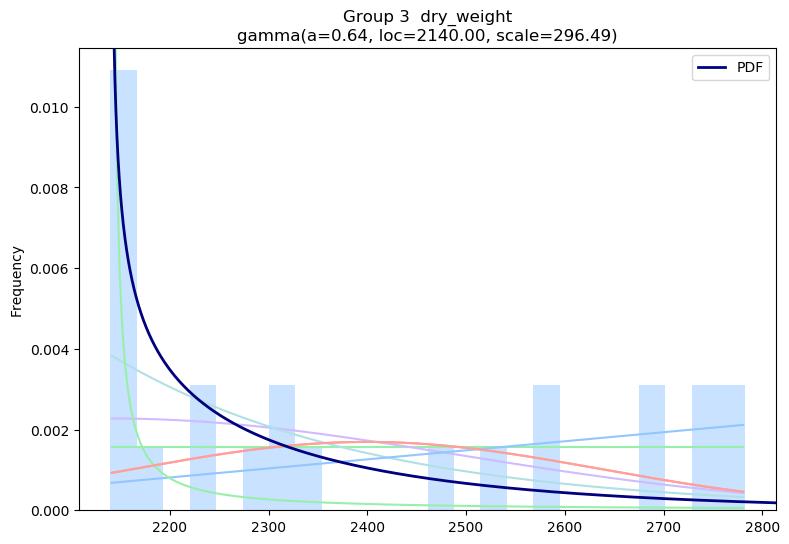

start water_cont
bins 24
Distribution found: triang


<Figure size 640x480 with 0 Axes>

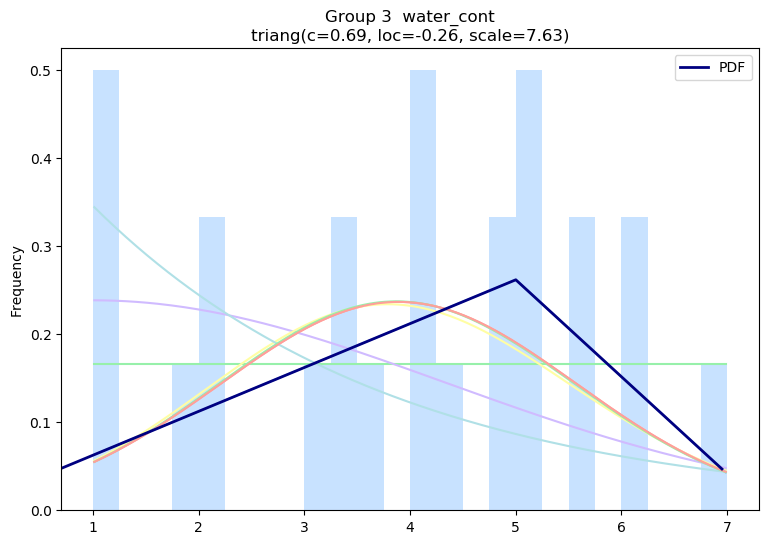

start UCS
bins 24
Distribution found: halfnorm


<Figure size 640x480 with 0 Axes>

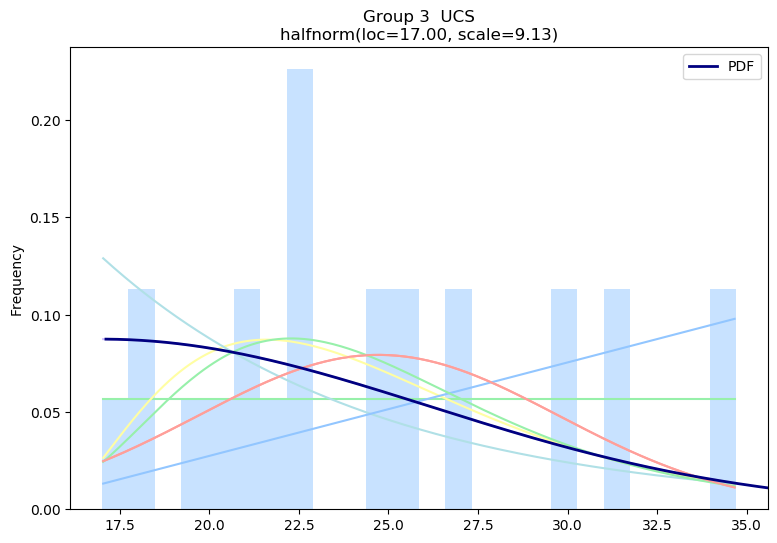

start elastic_mod
bins 24
Distribution found: lognorm


<Figure size 640x480 with 0 Axes>

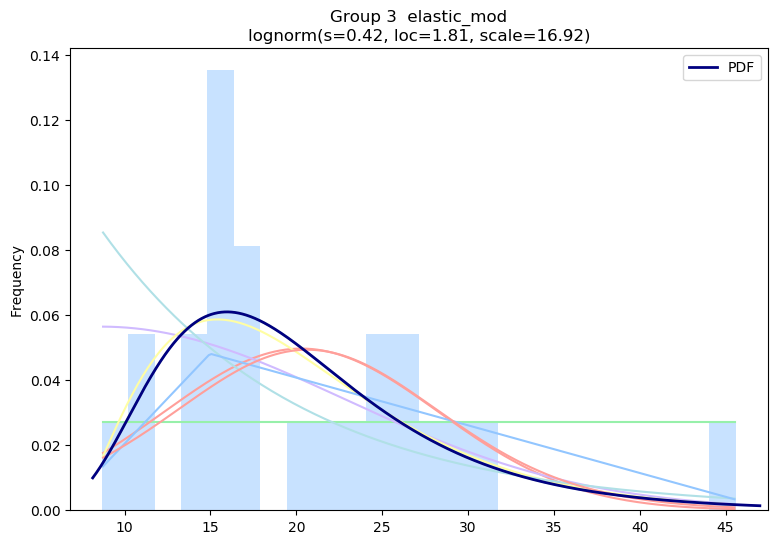

In [155]:
# ATTENZIONE I NOMI SONO SPARSI IN QUANTO IL CLASSIFICATORE NON SEGUE UN ORDINE PRECISO

# GR0  Basalt Weak
# GR1  Pyroclastic
# GR2  Basalt Strong +
# GR3  Nontronite
# GR4  Basalt Strong

# Nuovo...DA FARE

# GR0  Basalt Weak
# GR1  Pyroclastic
# GR2  Basalt Strong +
# GR3  Nontronite
# GR4  Basalt Strong


dict_names = {1:'basalt',2:'nontronite',3:'pyroclastic'}
dict_names2 = {0:'Group 0 ',1:'Group 1 ',2:'Group 2 ',3:'Group 3 ', 4:'Group 4 '}



list_class = df6.pred_class.unique().tolist()
list_class.sort()

for ee in list_class:
    
    # MUST define dfg
    
    dfg=df6[df6.pred_class==ee].loc[:,['dry_weight','water_cont','UCS','elastic_mod']].copy()
    
    dfg_index = dfg.index
    n_cols = dfg.shape[1]
    
    # Load data from statsmodels datasets

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    
    ax.clear()

    with plt.style.context(("seaborn-pastel",)):

        par_dict={}

        for e in np.arange(0,n_cols,1):

            print('start '+str(dfg.iloc[:,e].name))

            data = dfg.iloc[:,e].dropna().reset_index(drop=True).copy()
            data = pd.Series(data.values.ravel())

            bins = int(len(data))
            print('bins '+str(bins))

            y, x = np.histogram(data, bins=bins, density=True)
            x = (x + np.roll(x, -1))[:-1] / 2.0  #per ogni bin (x1 + x2)/2 trovo xc centroid


            # Plot for comparison all distribution lines *********
            
            plt.figure(figsize=(9,6))
            ax = data.plot(kind='hist', bins=bins, density=True, alpha=0.5)
            # Save plot limits

            dataYLim = ax.get_ylim()
            dataXLim = ax.get_xlim()   #(ax.get_xlim()[0]*0.8,ax.get_xlim()[1]*1.2)
            
            ax.set_xlabel('')
            ax.set_ylabel('Frequency')

            # Find best fit distribution
            best_fit_name, best_fit_params = best_fit_distribution(data, bins*10, ax)
            best_dist = getattr(st, best_fit_name)

            print('Distribution found: '+str(best_fit_name))
            
            
            ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)



            # Make PDF with best params 
            pdf = make_pdf(best_dist, best_fit_params)

            # Display

            
            ax = pdf.plot(lw=2, label='PDF', color='Navy', legend=True)
            
            param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
            param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
            dist_str = '{}({})'.format(best_fit_name, param_str)

            ax.set_title(dict_names2[int(ee)]+' '+dfg.columns[e] + u'\n' + dist_str)

#             ax.set_ylim(dataYLim)
            ax.set_xlim(dataXLim)
            plt.show()
            
            
            ## Save a file
            plt.savefig('PIC//'+dict_names2[int(ee)]+' '+dfg.columns[e]+'.jpg')
            
            # export a list  "par_list" with all results
            par_list = ([(k,v) for k,v in zip(param_names, best_fit_params)])
            par_dict[dfg.columns[e] + '_'+best_fit_name] = par_list               # parameters dictionary

            

#### CREATE A UNIQUE DB

In [156]:
df1.loc[index_df4,'pred_class'] = df6.pred_class*2

In [157]:
df1['pred_class']=df1['pred_class'].astype('str')

In [158]:
df1.pred_class = df1.pred_class*2

In [159]:
df1

,index,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T,pred_class,type_str
0,0,BS-1,2805.000,0.83,149.200,52.500000,0.2600,1,BS-S,13.769757,44,Basalt
1,1,BS-2,2732.000,0.84,125.600,54.600000,0.2600,1,BS-S,13.275439,44,Basalt
2,2,BS-3,2758.000,0.91,83.400,58.100000,0.1400,1,BS-S,11.575994,33,Basalt
3,3,BS - 4,2240.000,4.78,24.400,15.900000,0.1800,1,BS-W-Ves,5.146086,3333,Basalt
4,4,BS - 5,2578.000,5.09,22.600,16.600000,0.3900,1,BS-W-Ves,6.629644,3333,Basalt
...,...,...,...,...,...,...,...,...,...,...,...,...
205,229,BHA-135,2813.000,1.00,63.000,65.066418,0.2490,1,BS,10.549551,33,Basalt
206,230,BHA-136,2222.000,8.00,15.025,9.437054,0.2078,3,PYR,1.840000,11,Pyroclastic
207,231,BHA-137,2528.000,4.00,31.700,27.066851,0.1914,1,BS,6.240000,3333,Basalt
208,232,BHA-139,2466.000,4.00,51.600,16.900000,0.2100,1,BS,6.760000,22,Basalt


In [160]:
'''
Avendo considerato per il bs weak solo per UCS<35 i campioni della classe 2 di partenza rientrano nella classe finale strong(5)
0) Pyr
1) Non
2) Amyg
3) Ves
4) Weak 
5) Strong
'''

'\nAvendo considerato per il bs weak solo per UCS<35 i campioni della classe 2 di partenza rientrano nella classe finale strong(5)\n0) Pyr\n1) Non\n2) Amyg\n3) Ves\n4) Weak \n5) Strong\n'

In [161]:
dict_groups_final = {'11':'0','33':'5','44':'5','22':'4','0000':'1','1111':'2','2222':'3','3333':'4','4444':'4'}

In [162]:
df1['pred_class'] = df1['pred_class'].map(dict_groups_final)

In [163]:
df1

,index,name,dry_weight,water_cont,UCS,elastic_mod,poisson,type,rock_type,T,pred_class,type_str
0,0,BS-1,2805.000,0.83,149.200,52.500000,0.2600,1,BS-S,13.769757,5,Basalt
1,1,BS-2,2732.000,0.84,125.600,54.600000,0.2600,1,BS-S,13.275439,5,Basalt
2,2,BS-3,2758.000,0.91,83.400,58.100000,0.1400,1,BS-S,11.575994,5,Basalt
3,3,BS - 4,2240.000,4.78,24.400,15.900000,0.1800,1,BS-W-Ves,5.146086,4,Basalt
4,4,BS - 5,2578.000,5.09,22.600,16.600000,0.3900,1,BS-W-Ves,6.629644,4,Basalt
...,...,...,...,...,...,...,...,...,...,...,...,...
205,229,BHA-135,2813.000,1.00,63.000,65.066418,0.2490,1,BS,10.549551,5,Basalt
206,230,BHA-136,2222.000,8.00,15.025,9.437054,0.2078,3,PYR,1.840000,0,Pyroclastic
207,231,BHA-137,2528.000,4.00,31.700,27.066851,0.1914,1,BS,6.240000,4,Basalt
208,232,BHA-139,2466.000,4.00,51.600,16.900000,0.2100,1,BS,6.760000,4,Basalt
